#Domestic (US and US territories) Flight Delay Project
**w261 Final Project Team 19 Summer 2022**

Team Members: Grace Lee, Shivangi Pandey, Sybil Santos-Burgan, Beijing Wu

##Abstract
In Q2 of 2022 over 20% of scheduled flights were delayed. In April 2022, consumer complaints increased over 300% from April 2019. Many airlines have staffing issues as a lingering pandemic effect and in recent months “no major carrier [reliably arrived] on time more than 90 percent of the time”, a rarity before COVID. With air travel picking up and staffing issues persisting, delays will continue. These delays cause additional issues at airports needing to choreograph activity within and without. 

The goal of this study is to assist airport planning by predicting flight delays. We use domestic flight and airport data from the U.S. Department of Transportation and weather information from the National Oceanic and Atmospheric Administration repository. We will attempt several models to predict delays (defined as departures 15 minutes or more past planned departure times). We will predict using Logistic Regression for Classification and use F2-score, balanced accuracy, Matthews Correlation Coefficient, and AUC to evaluate the best performing model. Predictions will be two hours before planned departure to give airports time to manage operations. We conducted a logistic regression as a baseline, which had poor results and indicated room for improvement via feature engineering and parameter tuning.

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import pyspark.sql.functions as F
from pyspark.ml.feature import StringIndexer
from pyspark.sql import Window

from scipy import stats
from scipy.stats import norm

pd.options.display.float_format = '{:.0f}'.format
from pyspark.sql.functions import col
from pyspark.sql.functions import col, max

from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from pyspark.sql.functions import col,isnan,when,count

In [0]:
#Set up blob access
blob_container = "261finalproject" # The name of your container created in https://portal.azure.com
storage_account = "ssburgan" # The name of your Storage account created in https://portal.azure.com
secret_scope = "261finalprojectscope1" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "bestteam" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

# Inspect the Mount's Final Project folder 
# Please IGNORE dbutils.fs.cp("/mnt/mids-w261/datasets_final_project/stations_data/", "/mnt/mids-w261/datasets_final_project_2022/stations_data/", recurse=True)
data_BASE_DIR = "dbfs:/mnt/mids-w261/datasets_final_project_2022/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data/,parquet_airlines_data/,0,1656618287000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_1y/,parquet_airlines_data_1y/,0,1656630272000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0,1656630114000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0,1656630205000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data/,parquet_weather_data/,0,1656622074000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_1y/,parquet_weather_data_1y/,0,1656631614000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_3m/,parquet_weather_data_3m/,0,1656630651000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_6m/,parquet_weather_data_6m/,0,1656631047000
dbfs:/mnt/mids-w261/datasets_final_project_2022/stations_data/,stations_data/,0,1656713663000


## Hypothesis: 
We hope to assist airports in their planning by predicted flight delays. We hypothesize that tracking prior flight information will be a major predictor for departure delays. 

Null hypothesis: The addition of prior flight information to current flight and weather data has no impact on predicting departure delays

Alternate hypothesis: Adding information about tracking prior flights improves prediction of departure delays.

## EDA and Data Join Pipeline

![Pipeline Block Diagram](files/PipelineBlockDiagram3.png)

## Data Description

We use 2015 - 2021 domestic flight and airport data from the U.S. Department of Transportation and weather data from the National Oceanic and Atmospheric Administration repository. For a basic understanding of the data, we conducted exploratory analysis on 2015 Q1 (3 months) for each dataset. We also conducted further EDA on the joined dataset.

CSV Data can be partitioned and stored in parquet format. Parquet provides compression , storage of file metadata/schema within the file. CSV is row oriented while parquet is column oriented. This format provides advantages such as columnar storage is more efficient than row based as compression algorithms can make use of ‘similarity of adjacent data’ more readily than in row based methods. Also, data retrieval is faster as query can fetch relevant columns only which is beneficial in case of large dataset.

#### Flights 
This dataset contains information about domestic passenger flights on-time performance. The initial dataset contains 107 features, of which the DEP_DEL15 (departure delay 15 minutes or more) field is our target variable. This field is 0 when not delayed and 1 when delayed. From the EDA on the 3 month dataset, around 3% of this field is missing, which will be removed from the data when modeling. We anticipate that there will be an imbalanced classification problem, since around 20% of the non-missing data is delayed (again from the 3 month dataset).

Each record has a unique identifier for flight, datetime zone is in local time of airport region and military format. Record also contains delay and arrival metrics. Focus will be only on departed flights.

Key features we anticipate including:
* YEAR
* MONTH 
* FL_DATE 
* DAY_OF_WEEK
* OP_CARRIER 
* ORIGIN
* ORIGIN_CITY_MARKET_ID
* DEST
* CRS_DEP_TIME
* ARR_DELAY
* DIVERTED
* TAIL_NUM             
* DISTANCE
* CANCELLED
* DEP_DEL15

In [0]:
# Load 2015 Q1 for Flights
df_airlines = spark.read.parquet(f"{data_BASE_DIR}parquet_airlines_data_3m/")
display(df_airlines)

QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,YEAR
1,2,19,4,2015-02-19,AA,19805,AA,N520AA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,949,48.0,48.0,1.0,3,0900-0959,23.0,1012,1130,5.0,1058,1135,37.0,37.0,1.0,2,1000-1059,0.0,null,0.0,117.0,106.0,78.0,1.0,550.0,3,0.0,5.0,0.0,0.0,32.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015
1,2,20,5,2015-02-20,AA,19805,AA,N4XUAA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,855,-6.0,0.0,0.0,-1,0900-0959,11.0,906,1033,26.0,1058,1059,1.0,1.0,0.0,0,1000-1059,0.0,null,0.0,117.0,124.0,87.0,1.0,550.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015
1,2,21,6,2015-02-21,AA,19805,AA,N486AA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,1018,77.0,77.0,1.0,5,0900-0959,11.0,1029,1207,5.0,1058,1212,74.0,74.0,1.0,4,1000-1059,0.0,null,0.0,117.0,114.0,98.0,1.0,550.0,3,27.0,0.0,0.0,0.0,47.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015
1,2,22,7,2015-02-22,AA,19805,AA,N456AA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,853,-8.0,0.0,0.0,-1,0900-0959,9.0,902,1036,14.0,1058,1050,-8.0,0.0,0.0,-1,1000-1059,0.0,null,0.0,117.0,117.0,94.0,1.0,550.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015
1,2,23,1,2015-02-23,AA,19805,AA,N4XTAA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,n

#### Weather
This dataset contains weather condition information from 2015-2021 downloaded from the [National Oceanic and Atmospheric Administration](https://www.ncei.noaa.gov/access/metadata/landing-page/bin/iso?id=gov.noaa.ncdc:C00679) repository. It contains hourly weather information from stations in UTC datetime format. The initial dataset contains 177 features.

Key features categories we anticipate include:
* STATION
* DATE
* LATITUDE
* LONGITUDE
* NAME
* REPORT_TYPE
* HourlyDewPointTemperature
* HourlySkyConditions
* HourlyVisibility
* HourlyWindSpeed

In [0]:
# Load the 2015 Q1 for Weather
df_weather = spark.read.parquet(f"{data_BASE_DIR}parquet_weather_data_3m/").filter(col('DATE') > "2015-01-01T00:00:00.000")
display(df_weather)

STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDistance,BackupDistanceUnit,BackupElements,BackupElevation,BackupEquipment,BackupLatitude,BackupLongitude,BackupName,WindEquipmentChangeDate,YEAR
52652099999,2015-01-01T02:00:00,39.0833333,100.2833333,1462.0,"ZHANGYE, CH",FM-12,4,null,-1,3,null,null,+0.04,7,83,null,30.72,25.45,null,2,290,null,4,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,SYN06452652 32/// 92902 11163 21186 38618 40403 57015 333 00051 11045=,null,null,null,null,null,null,null,null,null,null,2015
52652099999,2015-01-01T05:00:00,39.0833333,100.2833333,1462.0,"ZHANGYE, CH",FM-12,4,null,-1,4,null,null,+0.01,7,77,null,30.68,null,null,null,320,null,4,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,nul

#### Stations

The stations dataset downloaded from the US Department of Transportation and provides metadata about each airport. The dataset contains station data and its neighbor station along with distance between stations. The initial dataset contains 10 features.

Key Features Categories we anticipate include:
* station_id
* neighbor_name
* neighbor_call
* distance_to_neighbor

In [0]:
df_stations = spark.read.parquet(f"{data_BASE_DIR}stations_data/*")
display(df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


#### Airline Names

The airline names is available from the [Bureau of Transportation Statistics](https://www.bts.gov/topics/airlines-and-airports/airline-codes) and provides the airline name description associated with each code.
The original csv was downloaded from [here](https://raw.githubusercontent.com/beanumber/airlines/master/data-raw/airlines.csv).

In [0]:
df_airline_names = spark.read.parquet(f"{blob_url}/airline_names")
df_airline_names = df_airline_names.withColumnRenamed("Code", "Airline_Code")
df_airline_names = df_airline_names.withColumnRenamed("Description", "Airline_Description")
display(df_airline_names)

Airline_Code,Airline_Description
02Q,Titan Airways
04Q,Tradewind Aviation
05Q,"Comlux Aviation, AG"
06Q,Master Top Linhas Aereas Ltd.
07Q,Flair Airlines Ltd.
09Q,"Swift Air, LLC"
0BQ,DCA
0CQ,ACM AIR CHARTER GmbH
0GQ,"Inter Island Airways, d/b/a Inter Island Air"
0HQ,Polar Airlines de Mexico d/b/a Nova Air


#### Airport Codes

The airport codes may refer to either IATA airport code, a three-letter code which is used in passenger reservation, ticketing and baggage-handling systems, or the ICAO airport code which is a four letter code used by ATC systems and for airports that do not have an IATA airport code.

The csv was downloaded from [datahub.io](https://datahub.io/core/airport-codes).

In [0]:
df_airport_codes = spark.read.parquet(f"{blob_url}/airport_codes")
df_airport_codes.createOrReplaceTempView("airports")
df_airport_codes = spark.sql("SELECT ident, type, name as airport_name,iata_code FROM airports where iata_code is not null")
display(df_airport_codes)
df_airport_codes.printSchema()

ident,type,airport_name,iata_code
03N,small_airport,Utirik Airport,UTK
07FA,small_airport,Ocean Reef Club Airport,OCA
0AK,small_airport,Pilot Station Airport,PQS
0CO2,small_airport,Crested Butte Airpark,CSE
0TE7,small_airport,LBJ Ranch Airport,JCY
13MA,small_airport,Metropolitan Airport,PMX
13Z,seaplane_base,Loring Seaplane Base,WLR
16A,small_airport,Nunapitchuk Airport,NUP
16K,seaplane_base,Port Alice Seaplane Base,PTC
19AK,small_airport,Icy Bay Airport,ICY


root
-- ident: string (nullable = true)
-- type: string (nullable = true)
-- airport_name: string (nullable = true)
-- iata_code: string (nullable = true)

In [0]:
#df_airport_names = spark.read.parquet(f"{blob_url}/airline_names")
#df_airport_codes = spark.read.parquet(f"{blob_url}/airport_codes")

df = df_airlines.join(df_airline_names,df_airlines.OP_UNIQUE_CARRIER ==  df_airline_names.Airline_Code,"inner") 
df = df.withColumnRenamed("DESCRIPTION", "CARRIER")

display(df)

QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,YEAR,Airline_Code,Airline_Description
1,2,19,4,2015-02-19,AA,19805,AA,N520AA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,949,48.0,48.0,1.0,3,0900-0959,23.0,1012,1130,5.0,1058,1135,37.0,37.0,1.0,2,1000-1059,0.0,null,0.0,117.0,106.0,78.0,1.0,550.0,3,0.0,5.0,0.0,0.0,32.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015,AA,American Airlines Inc.
1,2,20,5,2015-02-20,AA,19805,AA,N4XUAA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,855,-6.0,0.0,0.0,-1,0900-0959,11.0,906,1033,26.0,1058,1059,1.0,1.0,0.0,0,1000-1059,0.0,null,0.0,117.0,124.0,87.0,1.0,550.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015,AA,American Airlines Inc.
1,2,21,6,2015-02-21,AA,19805,AA,N486AA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,1018,77.0,77.0,1.0,5,0900-0959,11.0,1029,1207,5.0,1058,1212,74.0,74.0,1.0,4,1000-1059,0.0,null,0.0,117.0,114.0,98.0,1.0,550.0,3,27.0,0.0,0.0,0.0,47.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015,AA,American Airlines Inc.
1,2,22,7,2015-02-22,AA,19805,AA,N456AA,323,15016,1501603,31123,STL,"St. Louis, MO",MO,29,Missouri,64,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,901,853,-8.0,0.0,0.0,-1,0900-0959,9.0,902,1036,14.0,1058,1050,-8.0,0.0,0.0,-1,1000-1059,0.0,null,0.0,117.0,117.0,94.0,1.0,550.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015,AA,American Airlines Inc.
1,2,23,1,2015-02-23,AA,19805,AA,

#### Data Dictionary
The following data dictionaries are subset from the full data. The following featues were decided by domain knowledge and EDA (see below). We plan to use these features for further modeling. 

###### Airlines (Flights) Data: 

| Feature | Description | data type |
| --- | --- | --- |
| DEP_DEL15 | Indicator of departure delay 15 minutes or more. (1 = Yes) | float64 |
| YEAR | Year | int32 |
| QUARTER | Quarter | int32 |
| MONTH | Month | int32 |
| FL_DATE | Flight Date yyyy-mm-dd | string |
| DAY_OF_WEEK | Day of the Week | int32 |
| OP_CARRIER | Airline | string |
| ORIGIN | Origin Airport | string |
| DEST | Destination Airport | string |
| CRS_DEP_TIME | Computer Reservation System scheduled departure time | int32 |
| ARR_DELAY | Difference between scheduled and actual arrival time (in minutes) | float64 |
| DIVERTED | Diverted Flight Indicator (1 = Yes) | float64 |
| TAIL_NUM | Plane tail numbers | string |
| DISTANCE | Distance between airports (miles) | float64 |
| CANCELLED | Cancelled Flight Indicator (1 = Yes) | float64 |

###### Weather Data: 

| Feature | Description | data type |
| --- | --- | --- |
| STATION | Weather station code | string |
| DATE | Weather reading date yyyy-mm-dd hh:mm:ss | string |
| LATITUDE | Latitude of the weather station | float64 |
| LONGITUDE | Longitude of the weather station | float64 |
| NAME | Name of weather station | string |
| REPORT_TYPE |  Code that denotes the type of geophysical surface observation | string |
| OvercastIndex | Overcast weather indicator (0 = No, 1 = Yes) | float64 |
| WindSpeedAvg | Wind speed (in meters per second) averaged over 2-hour window prior to the time indicated | float64 |
| DewPointTempAvg | Dew point temperature (in Degrees Celsius) averaged over 2-hour window prior to the time indicated | float64 |
| VisibilityAvg | Visibility (in meters) averaged over 2-hour window prior to the time indicated | float64 |

###### Stations Data: 
| Feature | Description | data type |
| --- | --- | --- |
| station_id | Weather station code represents base weather station  | string  |
| neighbor_id | Weather station code represents neighboring stations from base station | string |
| neighbor_name | Name of station | string |
| neighbor_call | ICAO airport code | string |
| distance_to_neighbor | Distance from base station. Base station distance is 0. | double |

###### Airport Codes Data: 
| Feature | Description | data type |
| --- | --- | --- |
| ident | ICAO airport code | string |
| type | Type of location | string |
| airport_name | Name | string |
| iata_code | IATA code | string |

## EDA
The following EDA is done on the 2015 Q1 data (3 month dataset) as an initial view. Below this section will be further EDA on the joined data.

#### Airline

###### Summary Information

In [0]:
#The following features are variables we initially selected as important from looking at the Department of Transportation's data descriptions

keep_columns = ['YEAR','QUARTER','MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'FL_DATE', 
'OP_CARRIER', 'ORIGIN_AIRPORT_ID','ORIGIN', 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 
'ORIGIN_CITY_MARKET_ID','ORIGIN_STATE_FIPS','ORIGIN_STATE_NM','ORIGIN_WAC',
'DEST_AIRPORT_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_CITY_MARKET_ID',
'CRS_DEP_TIME', 'DEP_DELAY','ARR_DELAY', 'DEP_DELAY_GROUP', 'DEP_DEL15','DEP_TIME','DEP_TIME_BLK','TAXI_OUT', 'WHEELS_OFF',
'TAXI_IN', 'CRS_ARR_TIME', 'DIVERTED', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 
'FLIGHTS', 'DISTANCE', 'DISTANCE_GROUP', 'FIRST_DEP_TIME', 'TOTAL_ADD_GTIME', 'LONGEST_ADD_GTIME',
'DIV_AIRPORT_LANDINGS', 'DIV_REACHED_DEST', 'DIV_ACTUAL_ELAPSED_TIME', 'DIV_DISTANCE','TAIL_NUM',              
'CARRIER_DELAY','WEATHER_DELAY','NAS_DELAY','SECURITY_DELAY','LATE_AIRCRAFT_DELAY','CANCELLED'
]

df = df_airlines[keep_columns]
display(df)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_CITY_MARKET_ID,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_CITY_MARKET_ID,CRS_DEP_TIME,DEP_DELAY,ARR_DELAY,DEP_DELAY_GROUP,DEP_DEL15,DEP_TIME,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,TAXI_IN,CRS_ARR_TIME,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_DISTANCE,TAIL_NUM,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CANCELLED
2015,1,2,19,4,2015-02-19,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,48.0,37.0,3,1.0,949,0900-0959,23.0,1012,5.0,1058,0.0,117.0,106.0,78.0,1.0,550.0,3,null,null,null,0,null,null,null,N520AA,0.0,5.0,0.0,0.0,32.0,0.0
2015,1,2,20,5,2015-02-20,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,-6.0,1.0,-1,0.0,855,0900-0959,11.0,906,26.0,1058,0.0,117.0,124.0,87.0,1.0,550.0,3,null,null,null,0,null,null,null,N4XUAA,null,null,null,null,null,0.0
2015,1,2,21,6,2015-02-21,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,77.0,74.0,5,1.0,1018,0900-0959,11.0,1029,5.0,1058,0.0,117.0,114.0,98.0,1.0,550.0,3,null,null,null,0,null,null,null,N486AA,27.0,0.0,0.0,0.0,47.0,0.0
2015,1,2,22,7,2015-02-22,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,-8.0,-8.0,-1,0.0,853,0900-0959,9.0,902,14.0,1058,0.0,117.0,117.0,94.0,1.0,550.0,3,null,null,null,0,null,null,null,N456AA,null,null,null,null,null,0.0
2015,1,2,23,1,2015-02-23,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,null,null,null,null,null,0900-0959,null,null,null,1058,0.0,117.0,null,null,1.0,550.0,3,null,null,null,0,null,null,null,N4XTAA,null,null,null,null,null,1.0
2015,1,2,24,2,2015-02-24,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,-4.0,-13.0,-1,0.0,857,0900-0959,12.0,909,5.0,1058,0.0,117.0,108.0,91.0,1.0,550.0,3,null,null,null,0,null,null,null,N553AA,null,null,null,null,null,0.0
2015,1,2,25,3,2015-02-25,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,-1.0,-7.0,-1,0.0,900,0900-0959,10.0,910,8.0,1058,0.0,117.0,111.0,93.0,1.0,550.0,3,null,null,null,0,null,null,null,N454AA,null,null,null,null,null,0.0
2015,1,2,26,4,2015-02-26,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,0.0,18.0,0,0.0,901,0900-0959,41.0,942,6.0,1058,0.0,117.0,135.0,88.0,1.0,550.0,3,null,null,null,0,null,null,null,N568AA,0.0,0.0,18.0,0.0,0.0,0.0
2015,1,2,27,5,2015-02-27,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,-8.0,8.0,-1,0.0,853,0900-0959,10.0,903,31.0,1058,0.0,117.0,133.0,92.0,1.0,550.0,3,null,null,null,0,null,null,null,N475AA,null,null,null,null,null,0.0
2015,1,2,28,6,2015-02-28,AA,15016,STL,"St. Louis, MO",MO,31123,29,Missouri,64,11298,DFW,"Dallas/Fort Worth, TX",TX,30194,901,null,null,null,null,null,0900-0959,null,null,null,1058,0.0,117.0,null,null,1.0,550.0,3,null,null,null,0,null,null,null,N578AA,null,null,null,null,null,1.0


In [0]:
print("Total Count: ",df.count())
df.printSchema()
df.show(1, vertical=True)

Total Count: 2806942
root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: string (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- ORIGIN_STATE_FIPS: integer (nullable = true)
-- ORIGIN_STATE_NM: string (nullable = true)
-- ORIGIN_WAC: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DEST_CITY_MARKET_ID: integer (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_DELAY: double (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- DEP_DELAY_GROUP: integer (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- DEP_TIME: integer (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- TAXI_OUT: double (nullable = true)
-- WHEELS_OFF: integer (nullable = true)
-- TAXI_IN: double (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- DIVERTED: double (nullable = true)
-- CRS_ELAPSED_TIME: double (nullable = true)
-- ACTUAL_ELAPSED_TIME: double (nullable = true)
-- AIR_TIME: double (nullable = true)
-- FLIGHTS: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: integer (nullable = true)
-- FIRST_DEP_TIME: integer (nullable = true)
-- TOTAL_ADD_GTIME: double (nullable = true)
-- LONGEST_ADD_GTIME: double (nullable = true)
-- DIV_AIRPORT_LANDINGS: integer (nullable = true)
-- DIV_REACHED_DEST: double (nullable = true)
-- DIV_ACTUAL_ELAPSED_TIME: double (nullable = true)
-- DIV_DISTANCE: double (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- CARRIER_DELAY: double (nullable = true)
-- WEATHER_DELAY: double (nullable = true)
-- NAS_DELAY: double (nullable = true)
-- SECURITY_DELAY: double (nullable = true)
-- LATE_AIRCRAFT_DELAY: double (nullable = true)
-- CANCELLED: double (nullable = true)

-RECORD 0---------------------------------------
 YEAR | 2015 
 QUARTER | 1 
 MONTH | 2 
 DAY_OF_MONTH | 19 
 DAY_OF_WEEK | 4 
 FL_DATE | 2015-02-19 
 OP_CARRIER | AA 
 ORIGIN_AIRPORT_ID | 15016 
 ORIGIN | STL 
 ORIGIN_CITY_NAME | St. Louis, MO 
 ORIGIN_STATE_ABR | MO 
 ORIGIN_CITY_MARKET_ID | 31123 
 ORIGIN_STATE_FIPS | 29 
 ORIGIN_STATE_NM | Missouri 
 ORIGIN_WAC | 64 
 DEST_AIRPORT_ID | 11298 
 DEST | DFW 
 DEST_CITY_NAME | Dallas/Fort Worth... 
 DEST_STATE_ABR | TX 
 DEST_CITY_MARKET_ID | 30194 
 CRS_DEP_TIME | 901 
 DEP_DELAY | 48.0 
 ARR_DELAY | 37.0 
 DEP_DELAY_GROUP | 3 
 DEP_DEL15 | 1.0 
 DEP_TIME | 949 
 DEP_TIME_BLK | 0900-0959 
 TAXI_OUT | 23.0 
 WHEELS_OFF | 1012 
 TAXI_IN | 5.0 
 CRS_ARR_TIME | 1058 
 DIVERTED | 0.0 
 CRS_ELAPSED_TIME | 117.0 
 ACTUAL_ELAPSED_TIME | 106.0 
 AIR_TIME | 78.0 
 FLIGHTS | 1.0 
 DISTANCE | 550.0 
 DISTANCE_GROUP | 3 
 FIRST_DEP_TIME | null 
 TOTAL_ADD_GTIME | null 
 LONGEST_ADD_GTIME | null 
 DIV_AIRPORT_LANDINGS | 0 
 DIV_REACHED_DEST | null 
 DIV_ACTUAL_ELAPSED_TIME | null 
 DIV_DISTANCE | null 
 TAIL_NUM | N520AA 
 CARRIER_DELAY | 0.0 
 WEATHER_DELAY | 5.0 
 NAS_DELAY | 0.0 
 SECURITY_DELAY | 0.0 
 LATE_AIRCRAFT_DELAY | 32.0 
 CANCELLED | 0.0 
only showing top 1 row

###### On Time vs Delayed EDA

Out[111]:

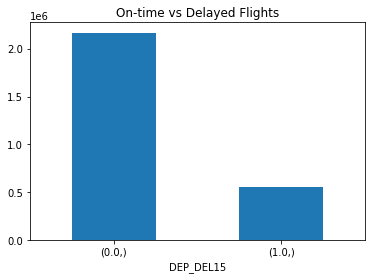

<AxesSubplot:title={'center':'On-time vs Delayed Flights'}, xlabel='DEP_DEL15'>

In [0]:
df.select('DEP_DEL15').toPandas().value_counts().plot.bar(title = "On-time vs Delayed Flights", legend = False, rot = 0)

In [0]:
# percent of data that is delayed (taking out the missing values)
print('percent late flights', df.filter(F.col('DEP_DEL15') == 1).select('DEP_DEL15').count()/df.filter((F.col('DEP_DEL15') == 1) | (F.col('DEP_DEL15')==0)).count())

# count number of delayed instances 
df.select('DEP_DEL15').toPandas().value_counts()

percent late flights 0.20413469535293097
Out[112]: DEP_DEL15
0 2166530
1 555702
dtype: int64

###### Missing Data

In [0]:
# Check where departure delays are missing
missing_dep_del15 = df.select('DEP_DEL15').toPandas().isnull().sum()
print('Count of missing', missing_dep_del15)
print('Count of total data: ', df.count())
float(missing_dep_del15)/df.count()

Count of missing DEP_DEL15 84710
dtype: int64
Count of total data: 2806942
Out[113]: 0.030178749685600914

In [0]:
#View how many nulls are in each column for feature selection 

display(df.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns]))


YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_CITY_MARKET_ID,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_CITY_MARKET_ID,CRS_DEP_TIME,DEP_DELAY,ARR_DELAY,DEP_DELAY_GROUP,DEP_DEL15,DEP_TIME,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,TAXI_IN,CRS_ARR_TIME,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_DISTANCE,TAIL_NUM,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CANCELLED
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,84710,93314,84710,84710,84710,0,86342,86342,88736,0,0,4,93314,93314,0,0,0,2788958,2788958,2788958,0,2800630,2802364,2800630,16380,2233778,2233778,2233778,2233778,2233778,0


In [0]:
#
print('Number of Missing in DEP_DELAY column:', df.filter(F.col('DEP_DELAY').isNull()).count())
print('Number of Missing in DEP_DELAY when NOT cancelled', df.filter((F.col('DEP_DELAY').isNull()) & (F.col('CANCELLED') != 1)).count())

print('Number of Missing in ARR_DELAY column:', df.filter(F.col('ARR_DELAY').isNull()).count())
print('Number of Missing in ARR_DELAY when NOT cancelled', df.filter((F.col('ARR_DELAY').isNull()) & (F.col('CANCELLED') != 1)).count())
print('Number of Missing in ARR_DELAY when NOT cancelled or diverted', df.filter((F.col('ARR_DELAY').isNull()) & (F.col('CANCELLED') != 1) & (F.col('DIVERTED') != 1)).count())

print('Number of Missing in ACTUAL_ELAPSED_TIME column:', df.filter(F.col('ACTUAL_ELAPSED_TIME').isNull()).count())
print('Number of Missing in ACTUAL_ELAPSED_TIME when NOT cancelled', df.filter((F.col('ACTUAL_ELAPSED_TIME').isNull()) & (F.col('CANCELLED') != 1)).count())
print('Number of Missing in ACTUAL_ELAPSED_TIME when NOT diverted', df.filter((F.col('ACTUAL_ELAPSED_TIME').isNull()) &  (F.col('DIVERTED')!=1)).count())
print('Number of Missing in ACTUAL_ELAPSED_TIME when NOT diverted or cancelled', df.filter((F.col('ACTUAL_ELAPSED_TIME').isNull()) & (F.col('CANCELLED')!=1) & (F.col('DIVERTED')!=1)).count())

print('Number of Missing in FIRST_DEP_TIME column:', df.filter(F.col('TAXI_IN').isNull()).count())
print('Number of Missing in FIRST_DEP_TIME when NOT cancelled', df.filter((F.col('TAXI_IN').isNull()) & (F.col('CANCELLED') != 1)).count())

print('Number of Missing in TOTAL_ADD_GTIME column:', df.filter(F.col('TOTAL_ADD_GTIME').isNull()).count())
print('Number of Missing in TOTAL_ADD_GTIME when NOT cancelled', df.filter((F.col('TOTAL_ADD_GTIME').isNull()) & (F.col('CANCELLED') != 1)).count())

print('Number of Missing in TAIL_NUM column:', df.filter(F.col('TAIL_NUM').isNull()).count())
print('Number of Missing in TAIL_NUM when NOT cancelled', df.filter((F.col('TAIL_NUM').isNull()) & (F.col('CANCELLED') != 1)).count())


Number of Missing in DEP_DELAY column: 84710
Number of Missing in DEP_DELAY when NOT cancelled 0
Number of Missing in ARR_DELAY column: 93314
Number of Missing in ARR_DELAY when NOT cancelled 6312
Number of Missing in ARR_DELAY when NOT cancelled or diverted 0
Number of Missing in ACTUAL_ELAPSED_TIME column: 93314
Number of Missing in ACTUAL_ELAPSED_TIME when NOT cancelled 6312
Number of Missing in ACTUAL_ELAPSED_TIME when NOT diverted 87002
Number of Missing in ACTUAL_ELAPSED_TIME when NOT diverted or cancelled 0
Number of Missing in FIRST_DEP_TIME column: 88736
Number of Missing in FIRST_DEP_TIME when NOT cancelled 1734
Number of Missing in TOTAL_ADD_GTIME column: 2788958
Number of Missing in TOTAL_ADD_GTIME when NOT cancelled 2703596
Number of Missing in TAIL_NUM column: 16380
Number of Missing in TAIL_NUM when NOT cancelled 0

| Feature | Notes about Missing | Accounting for Missing |
| --- | --- | --- |
| DEP_DELAY15 | All missing values are due to cancelled flights | Consider cancels as extended delay: recode nulls as 1 |
| ARR_DELAY | missing when cancelled or diverted | * We need this column for information about prior flight delay, currently we are undecided on whether to remove missing or fill |
| AIR_TIME | Null for diverted and cancelled flights | won't use this column because highly correlated with distance |
| ACTUAL_ELAPSED_TIME | Null for diverted and cancelled flights | won't use this column because highly correlated with distance |
| FIRST_DEP_TIME | mostly missing | won't use this column |
| TOTAL_ADD_GTIME | mostly missing | won't use this column |
| LONGEST_ADD_GTIME | mostly missing | won't use this column |
| DIV_REACHED_DEST | mostly missing | won't use this column |
| DIV_ACTUAL_ELAPSED_TIME | mostly missing | won't use this column |
| DIV_DISTANCE | mostly missing | won't use this column |
| TAIL_NUM | Only missing when flights cancelled | * We need this column for information about prior flight delay, currently we are undecided on whether to remove missing or fill |
| CARRIER_DELAY | this column, as well as weather, nas, security, late aircraft delays are missing | won't use this column |

###### Correlations Between Features

<command-1083953104575997>:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
 mask = np.zeros_like(corr, dtype=np.bool)

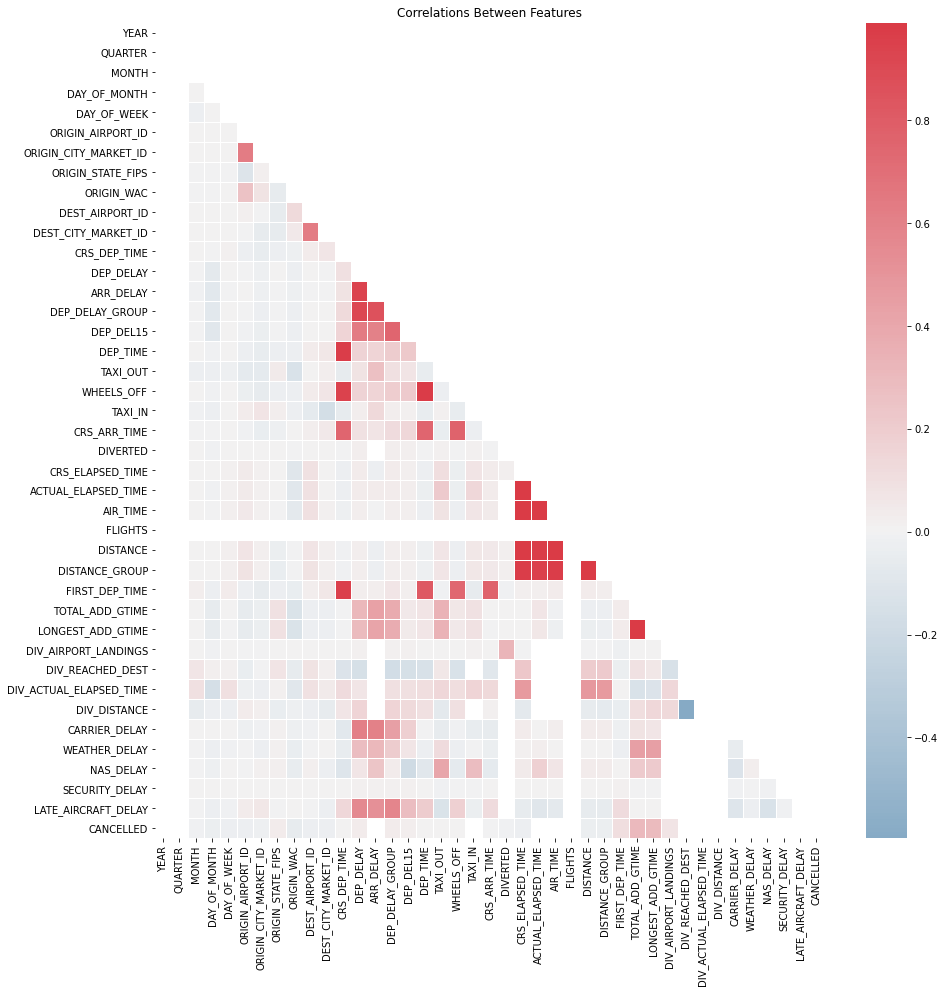

In [0]:
corr = df.toPandas().corr()
fig, ax = plt.subplots(figsize=(15, 15))
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5)
plt.title("Correlations Between Features")
plt.show()

In [0]:
#Narrowing down features to a select group
new_keep_columns =  ['DEP_DEL15', 'YEAR','QUARTER','MONTH', 'DAY_OF_WEEK', 'FL_DATE', 'OP_CARRIER', 'ORIGIN', 'DEST', 'CRS_DEP_TIME', 'ARR_DELAY', 'DIVERTED', 'DISTANCE', 'TAIL_NUM', 'CANCELLED']

df = df.select('DEP_DEL15', 'YEAR', 'MONTH','QUARTER', 'DAY_OF_WEEK', 'FL_DATE', 'OP_CARRIER', 'ORIGIN', 'DEST', 'CRS_DEP_TIME', 'ARR_DELAY', 'DIVERTED', 'DISTANCE', 'TAIL_NUM', 'CANCELLED')

#Summary info
for col in new_keep_columns:
  print(df.select(col).describe().show())


+-------+-------------------+
summary| DEP_DEL15|
+-------+-------------------+
 count| 2722232|
 mean|0.20413469535293097|
 stddev| 0.4030679610021786|
 min| 0.0|
 max| 1.0|
+-------+-------------------+

None
+-------+-------+
summary| YEAR|
+-------+-------+
 count|2806942|
 mean| 2015.0|
 stddev| 0.0|
 min| 2015|
 max| 2015|
+-------+-------+

None
+-------+-------+
summary|QUARTER|
+-------+-------+
 count|2806942|
 mean| 1.0|
 stddev| 0.0|
 min| 1|
 max| 1|
+-------+-------+

None
+-------+------------------+
summary| MONTH|
+-------+------------------+
 count| 2806942|
 mean| 2.02447075856929|
 stddev|0.8328232775017722|
 min| 1|
 max| 3|
+-------+------------------+

None
+-------+------------------+
summary| DAY_OF_WEEK|
+-------+------------------+
 count| 2806942|
 mean|3.9354058616102505|
 stddev| 1.996944547691946|
 min| 1|
 max| 7|
+-------+------------------+

None
+-------+----------+
summary| FL_DATE|
+-------+----------+
 count| 2806942|
 mean| null|
 stddev| null|
 min|2015-01-01|
 max|2015-03-31|
+-------+----------+

None
+-------+----------+
summary|OP_CARRIER|
+-------+----------+
 count| 2806942|
 mean| null|
 stddev| null|
 min| AA|
 max| WN|
+-------+----------+

None
+-------+-------+
summary| ORIGIN|
+-------+-------+
 count|2806942|
 mean| null|
 stddev| null|
 min| ABE|
 max| YUM|
+-------+-------+

None
+-------+-------+
summary| DEST|
+-------+-------+
 count|2806942|
 mean| null|
 stddev| null|
 min| ABE|
 max| YUM|
+-------+-------+

None
+-------+------------------+
summary| CRS_DEP_TIME|
+-------+------------------+
 count| 2806942|
 mean|1327.6009044718417|
 stddev| 474.359384910097|
 min| 1|
 max| 2359|
+-------+------------------+

None
+-------+------------------+
summary| ARR_DELAY|
+-------+------------------+
 count| 2713628|
 mean| 6.242928654922488|
 stddev|40.529044172882614|
 min| -87.0|
 max| 1971.0|
+-------+------------------+

None
+-------+--------------------+
summary| DIVERTED|
+-------+--------------------+
 count| 2806942|
 mean|0.002248710518421827|
 stddev|0.047367231487070095|
 min| 0.0|
 max| 1.0|
+-------+--------------------+

None
+-------+-----------------+
summary| DISTANCE|
+-------+-----------------+
 count| 2806942|
 mean|807.1014641556541|
 stddev|594.8670632121137|
 min| 31.0|
 max| 4983.0|
+-------+-----------------+

None
+-------+--------+
summary|TAIL_NUM|
+-------+--------+
 count| 2790562|
 mean| null|
 stddev| null|
 min| D942DN|
 max| N9EAMQ|
+-------+--------+

None
+-------+--------------------+
summary| CANCELLED|
+-------+--------------------+
 count| 2806942|
 mean|0.030995296660921386|
 stddev| 0.1733049305297949|
 min| 0.0|
 max| 1.0|
+-------+--------------------+

None

###### Correlations Between Selected Features

<command-4236430293314274>:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
 mask = np.zeros_like(corr, dtype=np.bool)

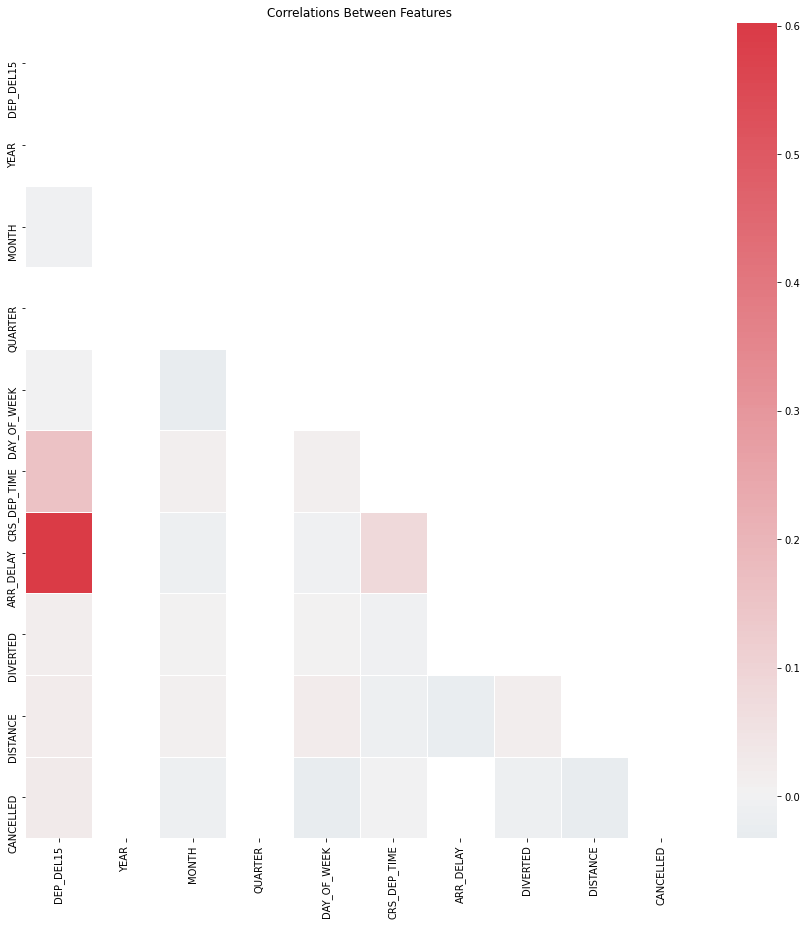

In [0]:
corr = df.toPandas().corr()
fig, ax = plt.subplots(figsize=(15, 15))
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5)
plt.title("Correlations Between Features")
plt.show()

Out[119]:

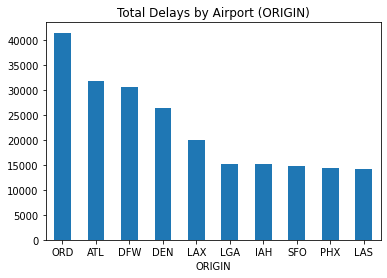

<AxesSubplot:title={'center':'Total Delays by Airport (ORIGIN)'}, xlabel='ORIGIN'>

In [0]:
#Delays by Airport Origin
df_airlines.createOrReplaceTempView("airport")
df_airport_delay = spark.sql("select ORIGIN, count(*) as Delays from airport where DEP_DEL15 = 1 group by ORIGIN order by Delays desc  LIMIT 10")
df_airport_delay.toPandas().plot.bar(title = "Total Delays by Airport (ORIGIN)", y='Delays',x='ORIGIN', legend = False, rot = 0) 

Out[120]:

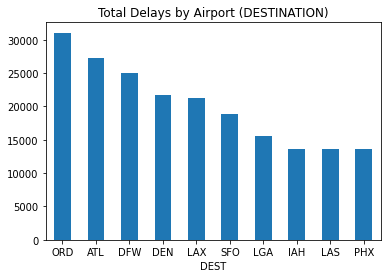

<AxesSubplot:title={'center':'Total Delays by Airport (DESTINATION)'}, xlabel='DEST'>

In [0]:
#Delays by Airport DEST
df_airlines.createOrReplaceTempView("airport")
df_airport_delay = spark.sql("select DEST, count(*) as Delays from airport where DEP_DEL15 = 1 group by DEST order by Delays desc  LIMIT 10")
df_airport_delay.toPandas().plot.bar(title = "Total Delays by Airport (DESTINATION)", y='Delays',x='DEST', legend = False, rot = 0) 

Out[121]:

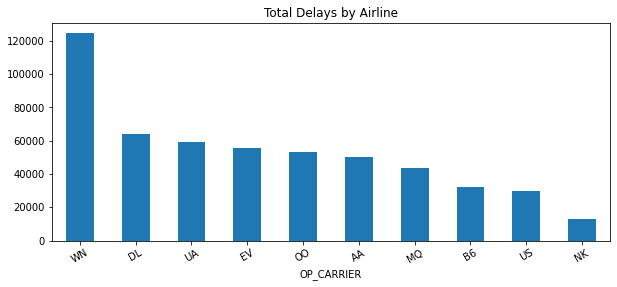

<AxesSubplot:title={'center':'Total Delays by Airline'}, xlabel='OP_CARRIER'>

In [0]:
# Distribution of Delayed by airline
df.createOrReplaceTempView("airline")
df_delay = spark.sql("select OP_CARRIER, count(*) as Delays from airline where DEP_DEL15 = 1 group by OP_CARRIER order by Delays desc  LIMIT 10")
df_delay.toPandas().plot.bar(title = "Total Delays by Airline", y='Delays',x='OP_CARRIER', legend = False, figsize = (10,4), rot = 30) 


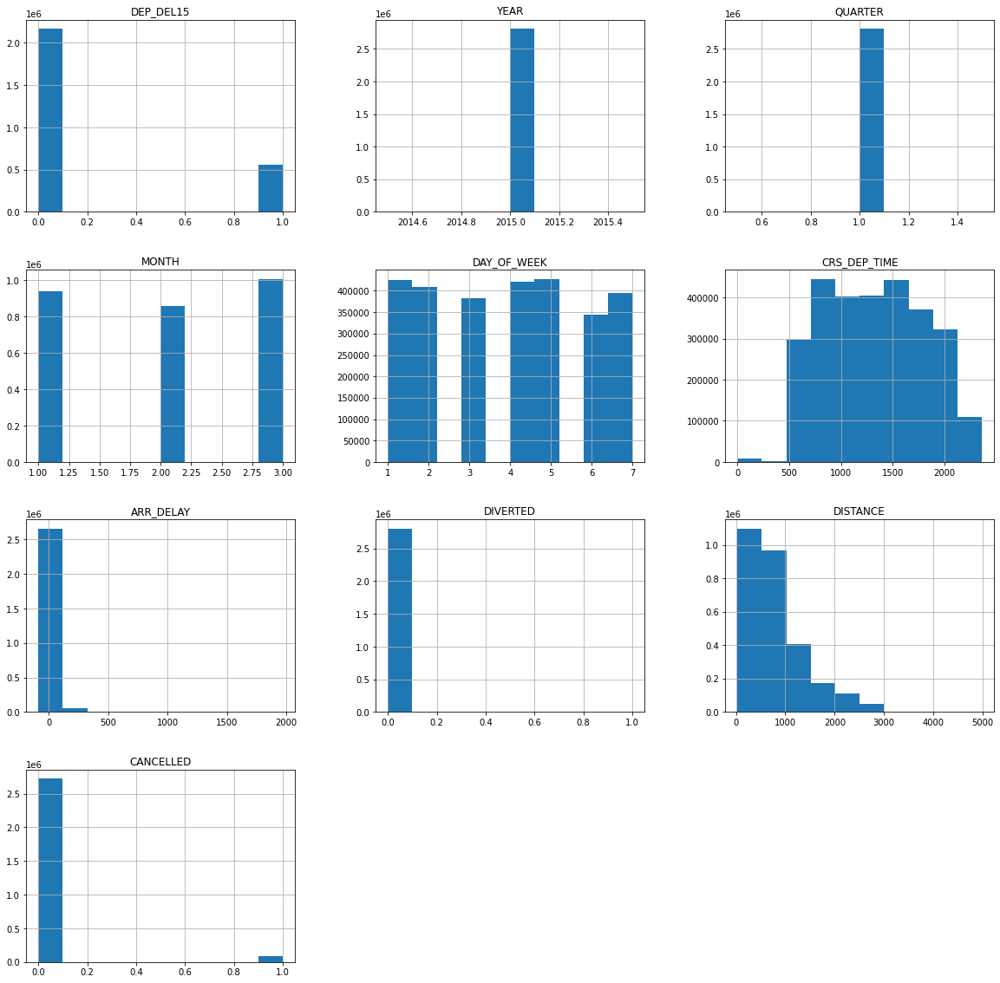

In [0]:
df.toPandas()[new_keep_columns].hist(figsize=(20,20), bins=10)
plt.show()

Out[123]:

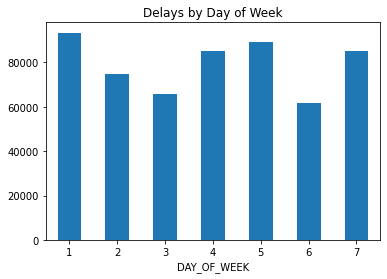

<AxesSubplot:title={'center':'Delays by Day of Week'}, xlabel='DAY_OF_WEEK'>

In [0]:
#Delays by Day of Week ORD
df.createOrReplaceTempView("airline")
df_day_week = spark.sql("select DAY_OF_WEEK, count(*) as day_count from airline where DEP_DEL15 == 1 group by DAY_OF_WEEK order by DAY_OF_WEEK")
df_day_week.toPandas().plot(y='day_count',x='DAY_OF_WEEK',kind = 'bar', title = 'Delays by Day of Week', rot = 0, legend = False) 

In [0]:
df.filter((F.col('DIV_REACHED_DEST').isNull()) & (F.col('DIVERTED')!=1)).toPandas().head(10)

Out[124]:

,DEP_DEL15,YEAR,MONTH,QUARTER,DAY_OF_WEEK,FL_DATE,OP_CARRIER,ORIGIN,DEST,CRS_DEP_TIME,ARR_DELAY,DIVERTED,DISTANCE,TAIL_NUM,CANCELLED
0,1,2015,2,1,4,2015-02-19,AA,STL,DFW,901,37,0,550,N520AA,0
1,0,2015,2,1,5,2015-02-20,AA,STL,DFW,901,1,0,550,N4XUAA,0
2,1,2015,2,1,6,2015-02-21,AA,STL,DFW,901,74,0,550,N486AA,0
3,0,2015,2,1,7,2015-02-22,AA,STL,DFW,901,-8,0,550,N456AA,0
4,NaN,2015,2,1,1,2015-02-23,AA,STL,DFW,901,NaN,0,550,N4XTAA,1
5,0,2015,2,1,2,2015-02-24,AA,STL,DFW,901,-13,0,550,N553AA,0
6,0,2015,2,1,3,2015-02-25,AA,STL,DFW,901,-7,0,550,N454AA,0
7,0,2015,2,1,4,2015-02-26,AA,STL,DFW,901,18,0,550,N568AA,0
8,0,2015,2,1,5,2015-02-27,AA,STL,DFW,901,8,0,550,N475AA,0
9,NaN,2015,2,1,6,2015-02-28,AA,STL,DFW,901,NaN,0,550,N578AA,1


In [0]:
#Duplicates
df_airlines.createOrReplaceTempView("airline")
print(df.count()) #2806942
df_nodup=spark.sql('select distinct * from airline') #1403471
print(df_nodup.count())

print('% duplicates', df_nodup.count() / df.count())


2806942
1403471
% duplicates 0.5

#### Weather

##### Summary Information

In [0]:
# Load the 2015 Q1 for Weather
df_weather = spark.read.parquet(f"{data_BASE_DIR}parquet_weather_data_3m/").filter(F.col('DATE') < "2015-04-01T00:00:00.000")
display(df_weather)

STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDistance,BackupDistanceUnit,BackupElements,BackupElevation,BackupEquipment,BackupLatitude,BackupLongitude,BackupName,WindEquipmentChangeDate,YEAR
52652099999,2015-01-01T02:00:00,39.0833333,100.2833333,1462.0,"ZHANGYE, CH",FM-12,4,null,-1,3,null,null,+0.04,7,83,null,30.72,25.45,null,2,290,null,4,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,SYN06452652 32/// 92902 11163 21186 38618 40403 57015 333 00051 11045=,null,null,null,null,null,null,null,null,null,null,2015
52652099999,2015-01-01T05:00:00,39.0833333,100.2833333,1462.0,"ZHANGYE, CH",FM-12,4,null,-1,4,null,null,+0.01,7,77,null,30.68,null,null,null,320,null,4,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,nul

In [0]:
pct_missing = df_weather.select([(F.count(F.when(F.col(c).contains("NULL") | F.col(c).isNull() | (F.col(c) == ""), c)) / F.count(F.lit(1))).alias(c) for c in df_weather.columns])
display(pct_missing)

STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,REM,BackupDirection,BackupDistance,BackupDistanceUnit,BackupElements,BackupElevation,BackupEquipment,BackupLatitude,BackupLongitude,BackupName,WindEquipmentChangeDate,YEAR
0.0,0.0,0.007899280812138074,0.007899280812138074,0.007899280812138074,0.00804039438163595,0.0,0.0,0.4611368709251737,0.17568485448498428,0.021326328667129926,0.8711878454178806,0.8713001008038298,0.7239947312359734,0.7142114466951353,0.17594958983054645,0.47419056398324433,0.6377050609785538,0.4921781875239489,0.3464304064758681,0.500559770146042,0.14252365699549557,0.9283327811735369,0.13248605357035348,0.9950396680463782,0.9950393404847034,0.9990585877466646,0.996564140080833,0.9990510210719771,0.9990597014563588,0.9970398906572925,0.9990585877466646,0.9970262640916213,0.996564140080833,0.9969152534400363,0.996564140080833,0.9965631901519761,0.996563452201316,0.9971203398046199,0.9969979627629199,0.9965610610010901,0.9987574602990337,0.9987937868887674,0.9970224971323614,0.9969959318805361,0.9969329090143073,1.0,0.9998938700173693,0.9998938700173693,0.999895769875083,0.9998958681435854,0.999895769875083,0.999895769875083,0.9998982593438114,0.9998989472233285,0.9998989472233285,0.9998982593438114,0.9998982593438114,0.9999091016352468,1.0,0.9999086758050696,0.9999121152026549,0.

##### Missing Data

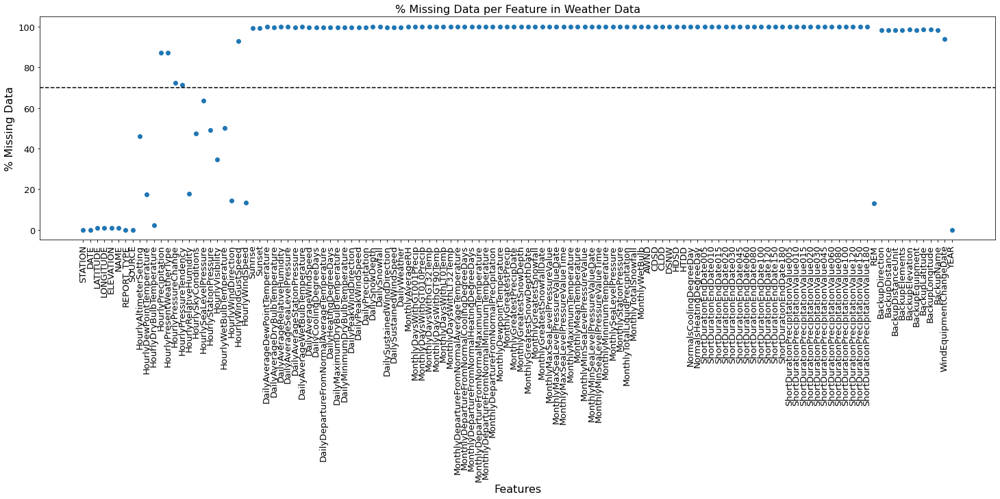

In [0]:
pct_missing_PD = pct_missing.toPandas().iloc[0]
plt.figure(figsize=(25, 6))
plt.scatter(pct_missing_PD.index, pct_missing_PD.values * 100)
plt.axhline(y = 70, color = "black", linestyle = "--")
plt.title("% Missing Data per Feature in Weather Data", fontsize = 16)
plt.xlabel("Features", fontsize = 16)
plt.ylabel("% Missing Data", fontsize = 16)
plt.xticks(rotation = 90, fontsize = 13)
plt.yticks(fontsize = 13)
plt.show()

In [0]:
# drop columns that have > 70% missing values
WEATHER_FEATURES = pd.Series(pct_missing_PD).where(lambda x: x < 0.7).dropna().index.tolist()
print(WEATHER_FEATURES)

['STATION', 'DATE', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'NAME', 'REPORT_TYPE', 'SOURCE', 'HourlyAltimeterSetting', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlySkyConditions', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWetBulbTemperature', 'HourlyWindDirection', 'HourlyWindSpeed', 'REM', 'YEAR']

* According to the Federal Aviation Administration, inclement weather, including thunderstorms, snowstorms, wind shear, icing and fog, creates potentially hazardous conditions in the nation’s airspace system. These conditions are, by far, the largest cause of flight delays. In an average year, inclement weather is the reason for nearly 70 percent of all delays.
* We analyzed the features in Weather data to determine whether they can be used as an indicator for inclement weather.

| Feature | Notes | Keep or Drop |
| --- | --- | --- |
| ELEVATION | Elevation of weather station | Drop |
| SOURCE | No dictionary to decode | Drop |
| HourlyAltimeterSetting | Indication of altitude | Drop |
| HourlyDewPointTemperature | Dew point temp -> amount of moisture in the air -> amount precipitation | Keep |
| HourlyDryBulbTemperature | Air temp; indication of heat | Drop |
| HourlyRelativeHumidity | Measure of the water vapor content of air | Drop |
| HourlySkyConditions | Need to decode to keep only the sky conditions codes | Keep |
| HourlySeaLevelPressure | For meteorology not flying | Drop |
| HourlyStationPressure | Pressure at the weather station elevation | Drop |
| HourlyVisibility | Measure of the horizontal opacity of the atmosphere at the point of observation; low -> fog | Keep |
| HourlyWetBulbTemperature | Indication of relative humidity | Drop |
| HourlyWindDirection | Will not consider wind direction to simplify the analysis | Drop |
| HourlyWindSpeed | Strong wind prevent flight taking off | Keep |
| REM | Remarks - cannot decode without dictionary | Drop |
| YEAR | Can extract from DATE if needed | Drop |

In [0]:
# list of features to be removed after researching their relevance
to_remove = ["ELEVATION", 
             "SOURCE", 
             "REM", 
             "HourlyWindDirection", 
             "HourlyAltimeterSetting", 
             "HourlyStationPressure", 
             "HourlyWindDirection", 
             "HourlyDryBulbTemperature", 
             "HourlyWetBulbTemperature", 
             "HourlyRelativeHumidity", 
             "HourlySeaLevelPressure", 
             "YEAR"]

WEATHER_FEATURES = [feature for feature in WEATHER_FEATURES if feature not in to_remove]

In [0]:
# Subset weather data with only columns has < 70% missing data
df_weather_subset = df_weather.select(WEATHER_FEATURES)

# filter for US only
df_weather_subset_US = df_weather_subset.filter(F.col("NAME").endswith("US"))
display(df_weather_subset_US)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,HourlyDewPointTemperature,HourlySkyConditions,HourlyVisibility,HourlyWindSpeed
99418099999,2015-01-01T00:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,6
99418099999,2015-01-01T01:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,3
99418099999,2015-01-01T02:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,5
99418099999,2015-01-01T03:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,1
99418099999,2015-01-01T04:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,0
99418099999,2015-01-01T05:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,5
99418099999,2015-01-01T06:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,6
99418099999,2015-01-01T07:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,6
99418099999,2015-01-01T08:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,3
99418099999,2015-01-01T09:00:00,48.32,-122.84,"SMITH ISLAND WA, US",FM-13,null,null,null,6


In [0]:
# Check missing data
pct_missing_US = df_weather_subset.select([(F.count(F.when(F.col(c).contains("null") | F.col(c).isNull() | (F.col(c) == ""), c)) / F.count(F.lit(1))).alias(c) for c in df_weather_subset.columns])
display(pct_missing_US)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,HourlyDewPointTemperature,HourlySkyConditions,HourlyVisibility,HourlyWindSpeed
0.0,0.0,0.007899280812138074,0.007899280812138074,0.007899280812138074,0.0,0.17568485448498428,0.47419056398324433,0.3464304064758681,0.13248605357035348


###### Decode HourlySkyConditions to get sky cover code
* OVC = overcast weather causes flight delays
* Parse the string, and keep the last sky cover code
* If OVC, mark OVC; else, mark not OVC
* One-hot encode to 1 = OVC and 0 = not OVC

In [0]:
def sky_decode(df):
  sky = F.split(df["HourlySkyConditions"], ":")
  df = (df.withColumn("SkyConditionCode", F.element_at(sky, -2))).drop("HourlySkyConditions")
  sky_code = F.split(df["SkyConditionCode"], " ")
  df = df.withColumn("SkyConditionCode", sky_code.getItem(2).cast("string"))\
         .withColumn("Overcast", F.when(F.col("SkyConditionCode").like("OVC"), F.lit("OVC")).otherwise("not OVC"))\
         .drop("SkyConditionCode")
  ovc_indexer = StringIndexer(inputCol = "Overcast", outputCol = "OvercastIndex")
  df = ovc_indexer.fit(df).transform(df).drop("Overcast")
  return df

In [0]:
df_weather_subset = sky_decode(df_weather_subset)
display(df_weather_subset)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,HourlyDewPointTemperature,HourlyVisibility,HourlyWindSpeed,OvercastIndex
52652099999,2015-01-01T02:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,-1,null,4,0.0
52652099999,2015-01-01T05:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,-1,null,4,0.0
52652099999,2015-01-01T08:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,-7,18.64,2,0.0
52652099999,2015-01-01T11:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,4,18.64,7,0.0
52652099999,2015-01-01T14:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,7,18.64,7,0.0
52652099999,2015-01-01T17:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,7,18.64,2,0.0
52652099999,2015-01-01T20:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,2,18.64,2,0.0
52652099999,2015-01-01T23:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,6,null,4,0.0
52652099999,2015-01-02T02:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,3,null,4,0.0
52652099999,2015-01-02T05:00:00,39.0833333,100.2833333,"ZHANGYE, CH",FM-12,0,null,7,0.0


In [0]:
# cast record to correct data type

float_columns = ["LATITUDE", "LONGITUDE", "HourlyDewPointTemperature", "HourlyVisibility", "HourlyWindSpeed"]

for col in float_columns:
  df_weather_subset = df_weather_subset.withColumn(col, F.col(col).cast("float"))

In [0]:
# average "HourlyDewPointTemperature", "HourlyVisibility", "HourlyWindSpeed" in a 2hr window prior to indicated timestamp per station
w = (Window.partitionBy(F.col("STATION")).orderBy(F.col("DATE").cast("long")).rowsBetween(-2*60*60, 0))

df_weather_agg = df_weather_subset.withColumn("DATE", F.from_unixtime(F.unix_timestamp("DATE", "yyyy-MM-dd'T'HH:mm:ss")))\
                                  .withColumn("WindSpeedAvg", F.avg(F.col("HourlyWindSpeed")).over(w))\
                                  .withColumn("DewPointTempAvg", F.avg(F.col("HourlyDewPointTemperature")).over(w))\
                                  .withColumn("VisibilityAvg", F.avg(F.col("HourlyVisibility")).over(w))\
                                  .drop("HourlyWindSpeed", "HourlyDewPointTemperature", "HourlyVisibility")
display(df_weather_agg)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,OvercastIndex,WindSpeedAvg,DewPointTempAvg,VisibilityAvg
01002099999,2015-01-01 04:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,16.0,25.0,null
01002099999,2015-01-01 07:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,16.0,25.5,null
01002099999,2015-01-01 10:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,17.333333333333332,25.666666666666668,null
01002099999,2015-01-01 13:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,17.0,25.75,null
01002099999,2015-01-01 16:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,17.6,25.8,null
01002099999,2015-01-01 19:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,18.333333333333332,25.666666666666668,null
01002099999,2015-01-02 01:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,17.0,25.0,null
01002099999,2015-01-02 04:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,16.0,24.625,null
01002099999,2015-01-02 07:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,16.22222222222222,24.333333333333332,null
01002099999,2015-01-02 10:00:00,80.05,16.25,"VERLEGENHUKEN, NO",FM-12,0.0,16.4,24.4,null


In [0]:
df_weather_agg_PD = df_weather_agg.toPandas()

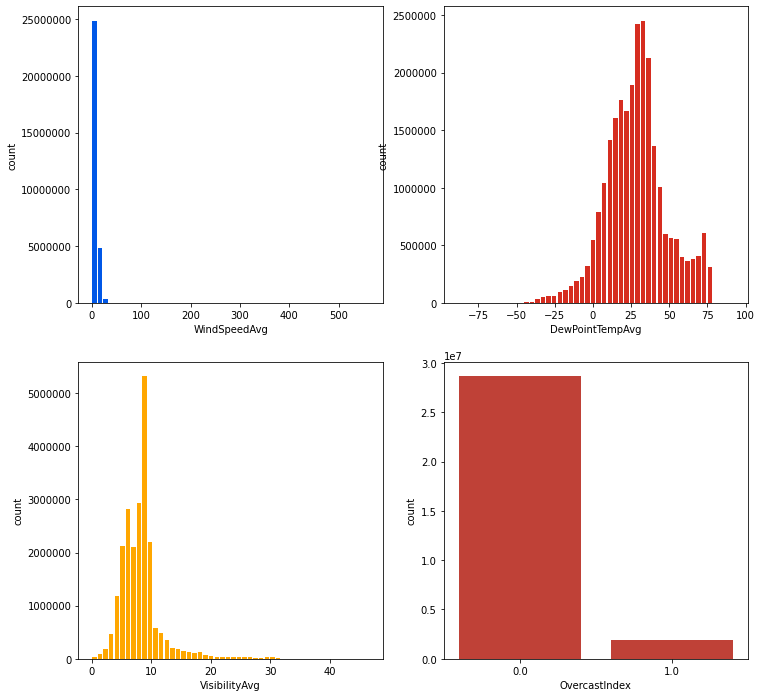

In [0]:
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0][0].hist(data = df_weather_agg_PD, x = "WindSpeedAvg", color = "#0057e7", bins = 50, rwidth = 0.8)
ax[0][0].set_xlabel("WindSpeedAvg")
ax[0][0].set_ylabel("count")
ax[0][0].ticklabel_format(style="plain")
ax[0][1].hist(data = df_weather_agg_PD, x = "DewPointTempAvg", color = "#d62d20", bins = 50, rwidth = 0.8)
ax[0][1].set_xlabel("DewPointTempAvg")
ax[0][1].set_ylabel("count")
ax[0][1].ticklabel_format(style="plain")
ax[1][0].hist(data = df_weather_agg_PD, x = "VisibilityAvg", color = "#ffa700", bins = 50, rwidth = 0.8)
ax[1][0].set_xlabel("VisibilityAvg")
ax[1][0].set_ylabel("count")
ax[1][0].ticklabel_format(style="plain")
sns.countplot(data = df_weather_agg_PD, x = "OvercastIndex", color = "#d62d20")

plt.show()


In [0]:
corr = df_weather_agg_PD.iloc[:, [7, 8, 9]].corr()
corr

Out[139]:

,WindSpeedAvg,DewPointTempAvg,VisibilityAvg
WindSpeedAvg,1,-0,-0
DewPointTempAvg,-0,1,-0
VisibilityAvg,-0,-0,1


##### Correlations Between Features

<command-1083953104576188>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
 mask = np.zeros_like(corr, dtype=np.bool)

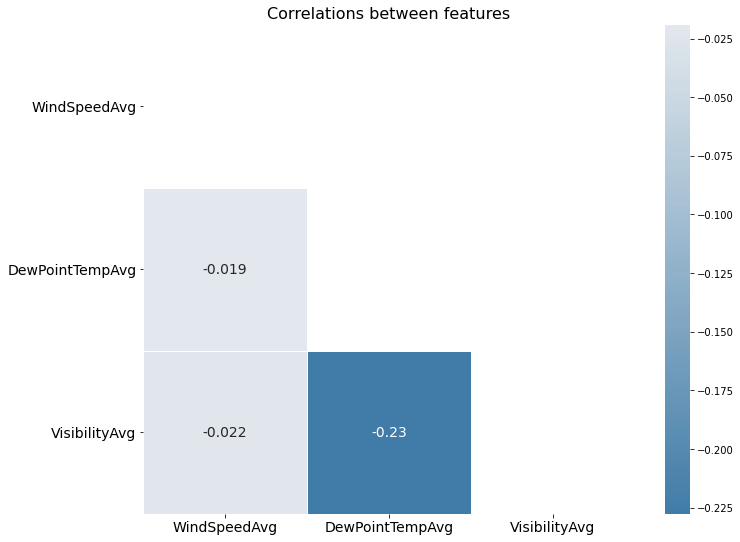

In [0]:
fig, ax = plt.subplots(figsize=(11, 9))
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5, annot = True, annot_kws = {"size": 14})
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize = 14)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 14, rotation = 0)
plt.title("Correlations between features", fontsize = 16)
plt.show()


### Station EDA

##### Summary Information

1) Stations have self join dataset of station and it neighboring stations along with distance between them
2) Stations with distance_to_neighbor=0 represents the self reported distance of station with itself
3) Stations with distance_to_neighbor=0 are at airport and would be nearest station to airport hence for joining airline with weather we are considering only stations at airport. Evidence that these stations are at airport we can see airport codes.

In [0]:
print("missing data per column in stations :")
df_sColumns= df_stations
x2=df_sColumns.select([count(when(isnan(c) | F.col(c).isNull(), c)).alias(c) for c in df_sColumns.columns])
display(x2)
# columns that no null or NAN column
selectList2=list()
for columnName in x2.columns:
  if x2.select(columnName).where(F.col(columnName)==0).count()==1:
    selectList2.append(columnName)
print("List of columns which have non zero column :")
print(selectList2)

print('***********************************************************OBSERVATIONS**********************************************************')
print('Repeated neighbors with distance_to_neighbor=0 ::')
df_stations.createOrReplaceTempView("df_stations")
df_stations1=spark.sql('select neighbor_id,neighbor_call,count(*) from df_stations where int(distance_to_neighbor)=0 group by neighbor_id,neighbor_call having count(*)>1') 
display(df_stations1)

#creating base stations list with min dist=0
df_base_stations=spark.sql('select station_id,neighbor_call,distance_to_neighbor from df_stations where int(distance_to_neighbor)=0')
df_base_stations.createOrReplaceTempView("base_stations")

print('*****************WEATHER STATIONS AT AIRPORT WHICH ARE REPEATED IN STATIONS DATASET ***********************************************')
display(df_stations[(F.col('neighbor_call')=='KLOZ') & (F.col('distance_to_neighbor')==0) & (F.col('neighbor_id')=='72329003849')])
print('*****************CONCLUSION : Above example illustrates that station_id 72329003849,72424303849 is located at same place*********** ')
print('*****************             Also we dont know how these station_id 72329003849,72424303849 is located at same place hence we are not filtering them out.\n \
                                    We filter only fixed stations later in weather dataset based on report-type (FM-12)*********** ')

print('******************proof that all distance 0 neighbors are airport stations : no output from this query*****************************')
display(spark.sql("select * from base_stations bs join airport_codes ac on neighbor_call=ident where type not like '%airport%'"))
df_base_stations=spark.sql('select station_id,neighbor_call,distance_to_neighbor from df_stations where int(distance_to_neighbor)=0') 
display(df_base_stations)

missing data per column in stations :

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
0,0,0,0,0,0,0,0,0,0,0,0


List of columns which have non zero column :
['usaf', 'wban', 'station_id', 'lat', 'lon', 'neighbor_id', 'neighbor_name', 'neighbor_state', 'neighbor_call', 'neighbor_lat', 'neighbor_lon', 'distance_to_neighbor']
***********************************************************OBSERVATIONS**********************************************************
Repeated neighbors with distance_to_neighbor=0 ::

neighbor_id,neighbor_call,count(1)
72329003849,KLOZ,2
72512114761,KPSB,2
70121326638,PIZ,2
74694113786,KECG,2
A0001163848,K47A,2
70121026624,PPIZ,2
72687600387,KGCD,2
72026463827,K6V3,2
72271093045,KTCS,2
91178022551,PHJR,2


*****************WEATHER STATIONS AT AIRPORT WHICH ARE REPEATED IN STATIONS DATASET ***********************************************

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
723290,03849,72329003849,37.087,-84.077,72329003849,CAPE GIRARDEAU RGNL,MO,KLOZ,37.087,-84.077,0.0
724243,03849,72424303849,37.087,-84.077,72329003849,CAPE GIRARDEAU RGNL,MO,KLOZ,37.087,-84.077,0.0


*****************CONCLUSION : Above example illustrates that station_id 72329003849,72424303849 is located at same place*********** 
***************** Also we dont know how these station_id 72329003849,72424303849 is located at same place hence we are not filtering them out.
 We filter only fixed stations later in weather dataset based on report-type (FM-12)*********** 
******************proof that all distance 0 neighbors are airport stations : no output from this query*****************************

station_id,neighbor_call,distance_to_neighbor,ident,type,name,elevation_ft,continent,iso_country,iso_region,municipality,gps_code,iata_code,local_code,coordinates
69014093101,KNZJ,0.0,KNZJ,closed,El Toro Marine Corps Air Station,383,NA,US,US-CA,Santa Ana,KNZJ,null,NZJ,"-117.73100280761719, 33.67610168457031"
70231226555,PAFK,0.0,PAFK,seaplane_base,Farewell Lake Seaplane Base,1052,NA,US,US-AK,Farewell Lake,PAFK,null,FKK,"-153.6230010986328, 62.54249954223633"
70269596402,PAJV,0.0,PAJV,closed,Jonesville Mine Airport,870,NA,US,US-AK,Sutton,null,null,null,"-148.9279942, 61.7314"
70381725357,PAEL,0.0,PAEL,seaplane_base,Elfin Cove Seaplane Base,0,NA,US,US-AK,Elfin Cove,PAEL,ELV,ELV,"-136.347000122, 58.195201873799995"
70388625348,PAAP,0.0,PAAP,seaplane_base,Port Alexander Seaplane Base,null,NA,US,US-AK,Port Alexander,PAAP,PTD,AHP,"-134.647994995, 56.246799469"
72224503882,KPFN,0.0,KPFN,closed,Panama City-Bay Co International Airport,20,NA,US,US-FL,Panama City,null,null,null,"-85.6828, 30.212099"
72291593114,KNTK,0.0,KNTK,closed,MCAS Tustin,52,NA,US,US-CA,Tustin,KNTK,null,NTK,"-117.827003479, 33.7066993713"
72400893781,KRZZ,0.0,KRZZ,closed,Halifax County Airport,256,NA,US,US-NC,Roanoke Rapids,KRZZ,RZZ,RZZ,"-77.7092971802, 36.4394989014"
72408614793,KNXX,0.0,KNXX,closed,Willow Grove Naval Air Station/Joint Reserve Base,358,NA,US,US-PA,Willow Grove,null,null,null,"-75.148201, 40.199795"
72509714790,KNZW,0.0,KNZW,closed,South Weymouth Naval Air Station,157,NA,US,US-MA,null,KNZW,null,NZW,"-70.93939971923828, 42.14860153198242"


station_id,neighbor_call,distance_to_neighbor
69002093218,KHGT,0.0
69007093217,KOAR,0.0
69014093101,KNZJ,0.0
70027127506,KPBA,0.0
70045027512,LNI,0.0
70063027403,POLI,0.0
70063526465,PAGB,0.0
70063627405,PAUD,0.0
70104626418,PACE,0.0
70119526625,PASH,0.0


## Join


Summary on Joining Dataset :
* All datasets are cleaned. Columns are removed if the column has 70% of NaNs, Nulls or invalid categorical information.

- For each quarter in a year 
    - Filter by year and quarter
    - Processing the data set quarter by quarter per  year
    - Left join airline data with base stations on icao to neighbor call, left join weather on base station and year

    - Filter by Flight date >= weather date 
    - Selected max weather row in the 2-5 hour time range before the flight departure date. 

Data is partitioned based on year and quarter


Note: Airports have IATA codes. For example, Chicago O’Hare International Airport has IATA code as ORD and ICAO code as KORD. ICAO code is used by weather stations. IATA code might not be the same as ICAO for some airports.

### Join Details & Statistics
Join Statistics on all data (table sizes, time to run joins, and cluster sizes) :  

Dataset:  
a) Airlines dataset : flight data from year 2015-2021 , Record Count=42430592  
b) Base Stations dataset: Weather stations at airport , Record Count=16689  
c) Weather dataset : All Stations dataset , Record Count=3056388  

Output dataset : 33 columns, Record Count = 25043236

Before Join:
Filter airline dataset for a year and quarter. Filter weather also for same year.

Join Criteria:  
a) Airline left join with base station and left join with weather station  
b) ICAO code (custom field) in Airline data = ICAO code in base stations  
c) Station id in base station = Station id in weather dataset  
d) Year of Weather and Airline is same  

Filter Criteria:  
a) Difference between Flight UTC timestamp and weather station should range between 2 (inclusive) and 5 hrs. lower bound is 2hrs and upper bound is 5 hrs difference. This is done in accordance to get recent weather data reported from a station just two hours prior to flight. Weather data has aggregated data over two hour window. Hence this bound made sense to avoid the overspilling of joining with unnecessary weather records.  (Note : we had no rounding of datetimestamp in weather or airline dataset)
b) Flight UTC timestamp will always be greater than weather station date  

Output columns in Joined dataset:  
airline columns, weather columns and Max of weather datetimestamp

Output File format & details:  
Dataset is written in blob storage in parquet format partitioned by year and quarter as join happens iteratively.  

Cluster Size during execution of Join query:   
Cluster Capacity/Cores : 112 GB, 28 Cores  
Worker Nodes: 6 (max based on cluster configuration)

Processing data iteratively per year and quarter  
Total Execution Time :  ~13.2 hrs (Note: At this time parallel execution of other notebooks were also happening)  
Total number of loops (iteration) : 24 (Year (2021-2015)+1 * Quarters (4))   
Per Batch (ie per year & quarter) : ~23 mins (best time) 

Join Query for reference :
Looping this per quarter & year :

    joined_quarter_dataset=spark.sql("SELECT \
                    q.DAY_OF_MONTH, q.DAY_OF_WEEK, q.TAIL_NUM,q.QUARTER,q.DEP_DEL15,q.YEAR,q.MONTH, q.FL_DATE,q.OP_CARRIER, q.ORIGIN, q.ORIGIN_CITY_MARKET_ID,q.DEST, \
                    q.CRS_DEP_TIME, q.ARR_DELAY, q.DIVERTED, q.DISTANCE,q.CANCELLED,q.DELAYED,q.FlightDepartUTCTimestamp,q.ICAO,\
                    w.STATION, w.LATITUDE,w.LONGITUDE, w.NAME, w.REPORT_TYPE, w.OvercastIndex, w.WindSpeedAvg, w.DewPointTempAvg, w.VisibilityAvg, \
                    max(w.date) as max_dt \
                    from quarter_dataset q left join base_stations bs on q.icao=bs.neighbor_call \
                    left join weather_dataset w on bs.station_id=w.station and  q.YEAR=w.WEATHER_YEAR\
                    where  \
                    q.FlightDepartUTCTimestamp>=w.date and \
                     (((bigint(to_timestamp(q.FlightDepartUTCTimestamp))-bigint(to_timestamp(w.date)))/3600)>=2  \
                     AND ((bigint(to_timestamp(q.FlightDepartUTCTimestamp))-bigint(to_timestamp(w.date)))/3600)<5) \
                    group by q.DAY_OF_MONTH, q.DAY_OF_WEEK, q.TAIL_NUM,q.QUARTER,q.DEP_DEL15,q.YEAR,q.MONTH, q.FL_DATE,q.OP_CARRIER, q.ORIGIN, q.ORIGIN_CITY_MARKET_ID,q.DEST, \
                    q.CRS_DEP_TIME, q.ARR_DELAY, q.DIVERTED, q.DISTANCE,q.CANCELLED,q.DELAYED,q.FlightDepartUTCTimestamp,q.ICAO,\
                    w.STATION, w.LATITUDE,w.LONGITUDE, w.NAME, w.REPORT_TYPE, w.OvercastIndex, w.WindSpeedAvg, w.DewPointTempAvg, w.VisibilityAvg")

    
    joined_quarter_dataset.write.parquet(f"{blob_url}/final_joined_data/YEAR={y}/QUARTER={q}")

<a href="https://adb-731998097721284.4.azuredatabricks.net/?o=731998097721284#notebook/148077048169809/command/148077048169881">Link to w261_final_project_joining_dataset</a>

In [0]:
#To run for full dataset remove /YEAR=2015
df_join = spark.read.parquet(f"{blob_url}/final_joined_data")
display(df_join)

DAY_OF_MONTH,DAY_OF_WEEK,TAIL_NUM,QUARTER,DEP_DEL15,YEAR,MONTH,FL_DATE,OP_CARRIER,ORIGIN,ORIGIN_CITY_MARKET_ID,DEST,CRS_DEP_TIME,ARR_DELAY,DIVERTED,DISTANCE,CANCELLED,DELAYED,FlightDepartUTCTimestamp,ICAO,STATION,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,OvercastIndex,WindSpeedAvg,DewPointTempAvg,VisibilityAvg,max_dt
1,1,248NV,3,0.0,2019,7,2019-07-01,G4,MEM,33244,SFB,1449,-9.0,0.0,671.0,0.0,0,2019-07-01T19:49:00.000+0000,KMEM,72334013893,35.0564,-89.9865,"MEMPHIS INTERNATIONAL AIRPORT, TN US",FM-12,0.0,8.539737387698686,48.82377332411887,9.295936061083529,2019-07-01 15:00:00
1,1,255NV,3,null,2019,7,2019-07-01,G4,BIS,30627,AZA,1713,null,0.0,1092.0,1.0,0,2019-07-01T22:13:00.000+0000,KBIS,72764024011,46.7825,-100.7572,"BISMARCK MUNICIPAL AIRPORT, ND US",FM-12,0.0,9.057353145396473,32.643492769744164,9.29530879252546,2019-07-01 18:00:00
1,1,259NV,3,0.0,2019,7,2019-07-01,G4,GRI,31980,AZA,1109,-5.0,0.0,905.0,0.0,0,2019-07-01T16:09:00.000+0000,KGRI,72552014935,40.9611,-98.3136,"GRAND ISLAND CENTRAL NE REGIONAL AIRPORT, NE US",FM-12,0.0,10.712737880261148,40.13413956074506,9.082746142721726,2019-07-01 12:00:00
1,1,274NV,3,0.0,2019,7,2019-07-01,G4,CVG,33105,JAX,1203,-5.0,0.0,613.0,0.0,0,2019-07-01T16:03:00.000+0000,KCVG,72421093814,39.0444,-84.6724,"CINCINNATI NORTHERN KENTUCKY INTERNATIONAL AIRPORT, KY US",FM-12,0.0,7.961388888888889,45.39138888888889,8.825257290555626,2019-07-01 13:00:00
1,1,276NV,3,0.0,2019,7,2019-07-01,G4,PIT,30198,VPS,2117,8.0,0.0,775.0,0.0,0,2019-07-02T01:17:00.000+0000,KPIT,72520094823,40.4846,-80.2144,"PITTSBURGH ASOS, PA US",FM-12,0.0,7.387022016222479,40.758516801854,9.158347278306755,2019-07-01 22:00:00
1,1,302NV,3,0.0,2019,7,2019-07-01,G4,MSO,33486,LAS,1444,-3.0,0.0,750.0,0.0,0,2019-07-01T20:44:00.000+0000,KMSO,72773024153,46.9208,-114.0925,"MISSOULA INTERNATIONAL AIRPORT, MT US",FM-12,0.0,4.860991528954312,31.961217681401166,8.984684856539388,2019-07-01 17:00:00
1,1,318NV,3,0.0,2019,7,2019-07-01,G4,BNA,30693,CID,0858,-18.0,0.0,481.0,0.0,0,2019-07-01T13:58:00.000+0000,KBNA,72327013897,36.11889,-86.68917,"NASHVILLE INTERNATIONAL AIRPORT, TN US",FM-12,0.0,6.9654214692403835,48.50298735584271,9.329802414151427,2019-07-01 09:00:00
1,1,321NV,3,0.0,2019,7,2019-07-01,G4,GJT,31921,LAS,0934,-8.0,0.0,420.0,0.0,0,2019-07-01T15:34:00.000+0000,KGJT,72476023066,39.1342,-108.54,"GRAND JUNCTION WALKER FIELD, CO US",FM-12,0.0,7.3197222222222225,29.356269113149846,9.739078747312488,2019-07-01 11:00:00
1,1,N102DU,3,0.0,2019,7,2019-07-01,DL,SLC,34614,SJC,1510,2.0,0.0,584.0,0.0,0,2019-07-01T21:10:00.000+0000,KSLC,72572024127,40.7781,-111.9694,"SALT LAKE CITY INTERNATIONAL AIRPORT, UT US",FM-12,0.0,8.086932370504096,33.0508545227178,9.385473238878056,2019-07-01 17:00:00
1,1,N103DU,3,0.0,2019,7,2019-07-01,DL,DTW,31295,BOS,1225,1.0,0.0,632.0,0.0,0,2019-07-01T16:25:00.000+0000,KDTW,72537094847,42.2313,-83.3308,"DETROIT METRO AIRPORT, MI US",FM-12,0.0,8.810240963855422,38.55861909175162,8.150039159233636,2019-07-01 13:00:00


In [0]:
#Add Hour Column
df_join = df_join.withColumn("HOUR", F.substring('CRS_DEP_TIME', 0, 2))

#Add Airline Description
df_join = df_join.join(df_airline_names, df_join.OP_CARRIER == df_airline_names.Airline_Code, "inner") 
display(df_join)

DAY_OF_MONTH,DAY_OF_WEEK,TAIL_NUM,QUARTER,DEP_DEL15,YEAR,MONTH,FL_DATE,OP_CARRIER,ORIGIN,ORIGIN_CITY_MARKET_ID,DEST,CRS_DEP_TIME,ARR_DELAY,DIVERTED,DISTANCE,CANCELLED,DELAYED,FlightDepartUTCTimestamp,ICAO,STATION,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,OvercastIndex,WindSpeedAvg,DewPointTempAvg,VisibilityAvg,max_dt,HOUR,Airline_Code,Airline_Description
1,1,248NV,3,0.0,2019,7,2019-07-01,G4,MEM,33244,SFB,1449,-9.0,0.0,671.0,0.0,0,2019-07-01T19:49:00.000+0000,KMEM,72334013893,35.0564,-89.9865,"MEMPHIS INTERNATIONAL AIRPORT, TN US",FM-12,0.0,8.539737387698686,48.82377332411887,9.295936061083529,2019-07-01 15:00:00,14,G4,Allegiant Air
1,1,255NV,3,null,2019,7,2019-07-01,G4,BIS,30627,AZA,1713,null,0.0,1092.0,1.0,0,2019-07-01T22:13:00.000+0000,KBIS,72764024011,46.7825,-100.7572,"BISMARCK MUNICIPAL AIRPORT, ND US",FM-12,0.0,9.057353145396473,32.643492769744164,9.29530879252546,2019-07-01 18:00:00,17,G4,Allegiant Air
1,1,259NV,3,0.0,2019,7,2019-07-01,G4,GRI,31980,AZA,1109,-5.0,0.0,905.0,0.0,0,2019-07-01T16:09:00.000+0000,KGRI,72552014935,40.9611,-98.3136,"GRAND ISLAND CENTRAL NE REGIONAL AIRPORT, NE US",FM-12,0.0,10.712737880261148,40.13413956074506,9.082746142721726,2019-07-01 12:00:00,11,G4,Allegiant Air
1,1,274NV,3,0.0,2019,7,2019-07-01,G4,CVG,33105,JAX,1203,-5.0,0.0,613.0,0.0,0,2019-07-01T16:03:00.000+0000,KCVG,72421093814,39.0444,-84.6724,"CINCINNATI NORTHERN KENTUCKY INTERNATIONAL AIRPORT, KY US",FM-12,0.0,7.961388888888889,45.39138888888889,8.825257290555626,2019-07-01 13:00:00,12,G4,Allegiant Air
1,1,276NV,3,0.0,2019,7,2019-07-01,G4,PIT,30198,VPS,2117,8.0,0.0,775.0,0.0,0,2019-07-02T01:17:00.000+0000,KPIT,72520094823,40.4846,-80.2144,"PITTSBURGH ASOS, PA US",FM-12,0.0,7.387022016222479,40.758516801854,9.158347278306755,2019-07-01 22:00:00,21,G4,Allegiant Air
1,1,302NV,3,0.0,2019,7,2019-07-01,G4,MSO,33486,LAS,1444,-3.0,0.0,750.0,0.0,0,2019-07-01T20:44:00.000+0000,KMSO,72773024153,46.9208,-114.0925,"MISSOULA INTERNATIONAL AIRPORT, MT US",FM-12,0.0,4.860991528954312,31.961217681401166,8.984684856539388,2019-07-01 17:00:00,14,G4,Allegiant Air
1,1,318NV,3,0.0,2019,7,2019-07-01,G4,BNA,30693,CID,0858,-18.0,0.0,481.0,0.0,0,2019-07-01T13:58:00.000+0000,KBNA,72327013897,36.11889,-86.68917,"NASHVILLE INTERNATIONAL AIRPORT, TN US",FM-12,0.0,6.9654214692403835,48.50298735584271,9.329802414151427,2019-07-01 09:00:00,08,G4,Allegiant Air
1,1,321NV,3,0.0,2019,7,2019-07-01,G4,GJT,31921,LAS,0934,-8.0,0.0,420.0,0.0,0,2019-07-01T15:34:00.000+0000,KGJT,72476023066,39.1342,-108.54,"GRAND JUNCTION WALKER FIELD, CO US",FM-12,0.0,7.3197222222222225,29.356269113149846,9.739078747312488,2019-07-01 11:00:00,09,G4,Allegiant Air
1,1,N102DU,3,0.0,2019,7,2019-07-01,DL,SLC,34614,SJC,1510,2.0,0.0,584.0,0.0,0,2019-07-01T21:10:00.000+0000,KSLC,72572024127,40.7781,-111.9694,"SALT LAKE CITY INTERNATIONAL AIRPORT, UT US",FM-12,0.0,8.086932370504096,33.0508545227178,9.385473238878056,2019-07-01 17:00:00,15,DL,Delta Air Lines Inc.
1,1,N103DU,3,0.0,2019,7,2019-07-01,DL,DTW,31295,BOS,1225,1.0,0.0,632.0,0.0,0,2019-07-01T16:25:00.000+0000,KDTW,72537094847,42.2313,-83.3308,"DETROIT METRO AIRPORT, MI US",FM-12,0.0,8.810240963855422,38.55861909175162,8.150039159233636,2019-07-01 13:00:00,12,DL,Delta Air Lines Inc.


#### Join EDA

In [0]:
print("Total Count Joined Set: ",df_join.count())
df_join.printSchema()
df_join.show(1, vertical=True)

Total Count Joined Set: 25043236
root
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- QUARTER: integer (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- YEAR: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- FL_DATE: date (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- CRS_DEP_TIME: string (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- DIVERTED: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- CANCELLED: double (nullable = true)
-- DELAYED: integer (nullable = true)
-- FlightDepartUTCTimestamp: timestamp (nullable = true)
-- ICAO: string (nullable = true)
-- STATION: string (nullable = true)
-- LATITUDE: float (nullable = true)
-- LONGITUDE: float (nullable = true)
-- NAME: string (nullable = true)
-- REPORT_TYPE: string (nullable = true)
-- OvercastIndex: double (nullable = true)
-- WindSpeedAvg: double (nullable = true)
-- DewPointTempAvg: double (nullable = true)
-- VisibilityAvg: double (nullable = true)
-- max_dt: string (nullable = true)
-- HOUR: string (nullable = true)
-- Airline_Code: string (nullable = true)
-- Airline_Description: string (nullable = true)

-RECORD 0----------------------------------------
 DAY_OF_MONTH | 1 
 DAY_OF_WEEK | 1 
 TAIL_NUM | 248NV 
 QUARTER | 3 
 DEP_DEL15 | 0.0 
 YEAR | 2019 
 MONTH | 7 
 FL_DATE | 2019-07-01 
 OP_CARRIER | G4 
 ORIGIN | MEM 
 ORIGIN_CITY_MARKET_ID | 33244 
 DEST | SFB 
 CRS_DEP_TIME | 1449 
 ARR_DELAY | -9.0 
 DIVERTED | 0.0 
 DISTANCE | 671.0 
 CANCELLED | 0.0 
 DELAYED | 0 
 FlightDepartUTCTimestamp | 2019-07-01 19:49:00 
 ICAO | KMEM 
 STATION | 72334013893 
 LATITUDE | 35.0564 
 LONGITUDE | -89.9865 
 NAME | MEMPHIS INTERNATI... 
 REPORT_TYPE | FM-12 
 OvercastIndex | 0.0 
 WindSpeedAvg | 8.539737387698686 
 DewPointTempAvg | 48.82377332411887 
 VisibilityAvg | 9.295936061083529 
 max_dt | 2019-07-01 15:00:00 
 HOUR | 14 
 Airline_Code | G4 
 Airline_Description | Allegiant Air 
only showing top 1 row

###### On Time vs Delayed Joined

In [0]:
df_delayed = df_join.filter(F.col('Delayed')==1)
df_notdelayed = df_join.filter(F.col('Delayed')==0)
print(df_delayed.count())
print(df_notdelayed.count())

4163553
20879683

Out[147]:

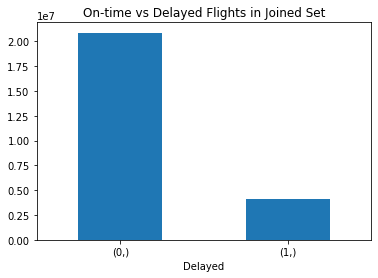

<AxesSubplot:title={'center':'On-time vs Delayed Flights in Joined Set'}, xlabel='Delayed'>

In [0]:
df_join.select('Delayed').toPandas().value_counts().plot.bar(title = "On-time vs Delayed Flights in Joined Set", legend = False, rot = 0)

##### Delays and No Delays by Airline (Joined)

Out[148]:

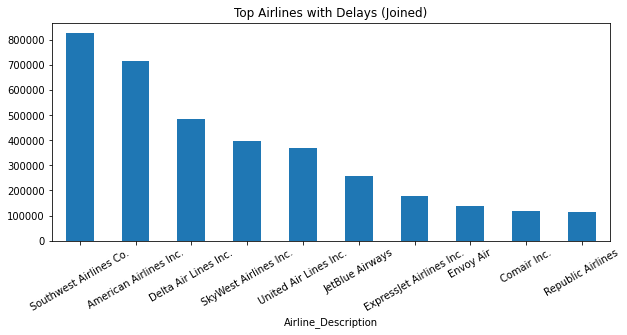

<AxesSubplot:title={'center':'Top Airlines with Delays (Joined)'}, xlabel='Airline_Description'>

In [0]:
# Distribution of Delayed by airline in joined
df_join.createOrReplaceTempView("airline")
df_delay = spark.sql("select Airline_Description, count(*) as Delays from airline where DELAYED = 1 group by Airline_Description order by Delays desc LIMIT 10")
df_delay.toPandas().plot.bar(title = "Top Airlines with Delays (Joined)", y='Delays',x='Airline_Description', legend = False, figsize = (10,4), rot = 30) 

Out[149]:

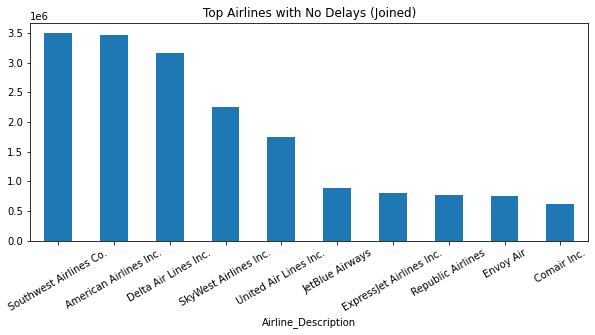

<AxesSubplot:title={'center':'Top Airlines with No Delays (Joined)'}, xlabel='Airline_Description'>

In [0]:
# Distribution of No Delays by Airline (Joined)
df_join.createOrReplaceTempView("airline")
df_delay = spark.sql("select Airline_Description, count(*) as Delays from airline where DELAYED = 0 group by Airline_Description order by Delays desc LIMIT 10")
df_delay.toPandas().plot.bar(title = "Top Airlines with No Delays (Joined)", y='Delays',x='Airline_Description', legend = False, figsize = (10,4), rot = 30) 

In [0]:
df_join.summary()

##### Correlations Between Features (Joined)

In [0]:
corr = df_join.toPandas().corr()
fig, ax = plt.subplots(figsize=(15, 15))
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5)
plt.title("Correlations Between Features (Joined)")
plt.show()

In [0]:
# We plan to follow the plan as shown in the above missing value table

display(df_join.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df_join.columns]))


## Machine Learning Algorithm

We plan to predict using logistic regression for classification. We will model the relationship of the independent features and the dependent feature, departure Delay or Not Delay. 

$$f(y) = \frac{1}{1+e^{-y}} $$
where 
$$ y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + ... + \beta_n x_n$$

The cost function to find the best model is a Maximum Likelihood Estimation Function.
 $$ \hat{\theta}^{MLE} = \underset{\theta \in \Theta}{argmax} \prod_{i = 1}^{n} p_\theta(y_i)  $$

The result of the logistic regression prediction is the likelihood that the actual flight departure is 1 (Delayed).  The baseline model we will use is when the predicted likelihood greater than or equal to 0.5 is Delayed, and lower than 0.5 is not Delayed. 

Because there is imbalanced data, we plan to use undersampling to create the training data used in the model. As we build our model, we plan to use forward chaining cross validation to optimize parameters. In this case, we think it is more important for airports to be prepared for any potential delay, even if the delay prediction is false, rather than miss a delay that might cause a mess in last minute planning at the airports. Therefore, we prefer false positives over false negatives and will adjust the model thresholds accordingly.

## Metrics to Measure Success
We will compare model results using the following four metrics to evaluate the model performance: 

##### F2 Score
F2 score is a weighted harmonic mean of precision and recall. This metric gives more weight to recall than to precision, which means False Positives are considered better than False Negatives, which is what we think is important for flight delays.   
$$ F_2 Score = 5(\frac{Precision * Recall}{4Precision + Recall}) $$
$$ Precision = \frac{TP}{TP + FP} $$
$$ Recall = \frac{TP}{TP + FN} $$

##### MCC (Matthews Correlation Coefficient)
This metric represents the confusion matrix as a single number, and helps with imbalanced data. MCC takes into account the proportion of each class. This metric ranges from -1 to 1, and -1 indicates the model is predicting the opposite class from the actual value, 0 is similar to random guessing, and 1 indicates a perfect classification.
$$ MCC = \frac{TP * TN - FP * FN}{\sqrt{(TP+FP)(TP+FN)(TN+FP)(TN+FN)}}$$

##### Balanced Accuracy
Since the data is imbalanced, a normal accuracy metric will be high just by predicting the majority class, which is misleading. We instead will use balanced accuracy which takes into account different class sizes. 
$$ Balanced\ Accuracy = \frac{sensitivity + specificity}{2}$$
$$ Sensitivity = \frac{TP}{TP + FN}$$
$$ Specificity = \frac{TN}{TN + FP}$$

##### AUC (Area Under the ROC curve)
This metric evaluates how well the model can distinguish true positives and false positives. Although we would prefer to predict more positives, it would still be good to know how well the model is doing on the positive prediction side. An AUC of 1 indicates a perfect model, while AUC of 0.5 indicates a model that is no better than random guessing

## Modeling Pipeline

![Pipeline Block Diagram](files/Pipeline_Diagram.png)

## Baseline Model
Number of input features:
Number of experiments: 1 in this proposal

In [0]:

print("------------------------------------------------------------------------------------------------")
print("Choosing variables to predict delays")
myY = "DELAYED"
 
#airline, 
categoricals = [
'OP_CARRIER','HOUR', 'MONTH'
]

numerics = [
'VisibilityAvg'
]

myX = categoricals + numerics

df2 = df_join.select(myX + [myY])

test = df_join.filter(F.col('YEAR') == '2021')
train = df_join.subtract(test)
print('Train ', train.count())
print('Test ', test.count())


------------------------------------------------------------------------------------------------
Choosing variables to predict delays
Train 21506557
Test 3536679

In [0]:
#Undersampling
def resample(base_features,class_field,base_class):
    """base_feature: dataframe with the features. 
     class_field: name of the column that holds the classes. (dep delay)
     base_class: positive class"""
    pos = base_features.filter(F.col(class_field)==base_class)
    neg = base_features.filter(F.col(class_field)!=base_class)
    total_pos = pos.count()
    total_neg = neg.count()
    fraction=float(total_pos)/float(total_neg)
    sampled = neg.sample(False,fraction)
    return sampled.union(pos)
  
# separate minority and majority classes
train_resampled = resample(train,"Delayed",1)

train_resampled_delayed = train_resampled.filter(F.col('Delayed')==1)
train_resampled_notdelayed = train_resampled.filter(F.col('Delayed')==0)

print('delayed:', train_resampled_delayed.count())
print('not delayed', train_resampled_notdelayed.count())



delayed: 3571674
not delayed 3569189

In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler, OneHotEncoder
from pyspark.ml.feature import StandardScaler, Imputer
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.mllib.evaluation import BinaryClassificationMetrics

## Current possible ways to handle categoricals in string indexer is 'error', 'keep', and 'skip'
indexers = map(lambda c: StringIndexer(inputCol=c, outputCol=c+"_idx", handleInvalid = 'keep'), categoricals)
ohes = map(lambda c: OneHotEncoder(inputCol=c + "_idx", outputCol=c+"_class"),categoricals)
imputers = Imputer(inputCols = numerics, outputCols = numerics)

# Establish features columns
featureCols = list(map(lambda c: c+"_class", categoricals)) + numerics

# Build the stage for the ML pipeline
model_matrix_stages = list(indexers) + list(ohes) + [imputers] + \
                    [VectorAssembler(inputCols=featureCols, outputCol="features"), StringIndexer(inputCol="DELAYED", outputCol="label")]
# model_matrix_stages = list(indexers) + list(ohes) + \
#                      [VectorAssembler(inputCols=featureCols, outputCol="features"), StringIndexer(inputCol="DELAYED", outputCol="label")]
# Apply StandardScaler to create scaledFeatures
scaler = StandardScaler(inputCol="features",
                        outputCol="scaledFeatures",
                        withStd=True,
                        withMean=True)

print("Featured Columns ", featureCols)

# Use logistic regression 
lr = LogisticRegression(maxIter=10, elasticNetParam=0.5, featuresCol = "scaledFeatures")

# Build our ML pipeline
pipeline = Pipeline(stages=model_matrix_stages+[scaler]+[lr])

# Build the parameter grid for model tuning
paramGrid = ParamGridBuilder() \
              .addGrid(lr.regParam, [0.1, 0.01]) \
              .build()

# Execute CrossValidator for model tuning
crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=BinaryClassificationEvaluator(),
                          numFolds=5)

Featured Columns ['OP_CARRIER_class', 'HOUR_class', 'MONTH_class', 'VisibilityAvg']

In [0]:
# Train the tuned model and establish our best model
cvModel = crossval.fit(train_resampled)

In [0]:
glm_model = cvModel.bestModel
pred_df = glm_model.transform(test)


### Train Results

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
 warnings.warn(

FPR,TPR
0.0,0.0
6.719538233332605E-6,7.620778837993729E-5
1.2599134187498635E-5,1.451310087529688E-4
2.3518383816664118E-5,2.244207297512124E-4
3.051790280971892E-5,3.0623203198261564E-4
3.6957460283329326E-5,3.751552523556472E-4
5.8515978781938106E-5,5.970544008736999E-4
7.307497828749208E-5,6.861502711120089E-4
8.203436259860222E-5,7.5843559979592E-4
8.98738238708236E-5,8.29600225709538E-4


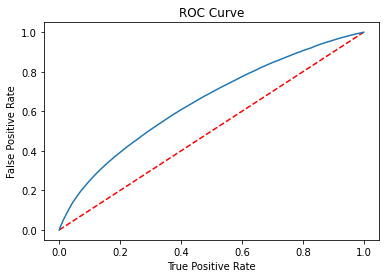

Training set areaUnderROC: 0.6470152711241384

In [0]:
#AREA UNDER THE ROC CURVE
#In general, an AUC of 0.5 suggests no discrimination (i.e., ability to diagnose patients with and without the disease or condition based on the #test), 0.7 to 0.8 is considered acceptable, 0.8 to 0.9 is considered excellent, and more than 0.9 is considered outstanding.

# Return ROC
lr_summary = glm_model.stages[len(glm_model.stages)-1].summary
display(lr_summary.roc)

roc = lr_summary.roc.toPandas()
plt.plot([0, 1], [0, 1], 'r--')
plt.plot(roc['FPR'],roc['TPR'])
plt.ylabel('False Positive Rate')
plt.xlabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()
print('Training set areaUnderROC: ' + str(lr_summary.areaUnderROC))

In [0]:
def extract(row):
  return (row.Delayed,) + tuple(row.probability.toArray().tolist()) +  (row.label,) + (row.prediction,)

def score(model,data):
  pred = model.transform(data).select("Delayed", "probability", "label", "prediction")
  pred = pred.rdd.map(extract).toDF(["Delayed", "p0", "p1", "label", "prediction"])
  return pred 

def auc(pred):
  metric = BinaryClassificationMetrics(pred.select("p1", "label").rdd)
  return metric.areaUnderROC

glm_train = score(glm_model, train_resampled)

glm_train.createOrReplaceTempView("glm_train")

print ("GLM Training AUC:" + str(auc(glm_train)))

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
 warnings.warn(
GLM Training AUC:0.6469379138927474

In [0]:
# Train set performance Metrics
TP = glm_train.filter((F.col('Delayed')==1) & (F.col('prediction') == 1) ).count()
TN = glm_train.filter((F.col('Delayed')==0) & (F.col('prediction') == 0) ).count()
FP = glm_train.filter((F.col('Delayed')==0) & (F.col('prediction') == 1) ).count()
FN = glm_train.filter((F.col('Delayed')==1) & (F.col('prediction') == 0) ).count()

print("True Positives:", TP)
print("True Negatives:", TN)
print("False Positives:", FP)
print("False Negatives:", FN)

import math
precision = TP / (TP + FP)
recall = TP / (TP + FN) # also known as sensitivity
specificity = TN / (TN + FP)

## F2 Score
F2 = 5 * ((precision * recall) / (4*precision + recall))

## MCC
MCC = (TP * TN - FP * FN)/ math.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN))

## Balanced Accuracy
Balanced_Accuracy = (recall + specificity)/2

print('F2 =', F2)
print('MCC =', MCC)
print('Balanced Accuracy =', Balanced_Accuracy)


True Positives: 1110399
True Negatives: 1718776
False Positives: 1849672
False Negatives: 2461275
F2 = 0.3219151160330513
MCC = -0.2105464850273092
Balanced Accuracy = 0.396274804580701

### Test results

In [0]:
# AUC for Test
glm_test = score(glm_model, test)
glm_test.createOrReplaceTempView("glm_test")
print ("GLM Test AUC :" + str(auc(glm_test)))

GLM Test AUC :0.648601903743247

In [0]:
from sklearn.metrics import classification_report, confusion_matrix

y_true = pred_df.select(['Delayed']).collect()
y_pred = pred_df.select(['prediction']).collect()

print(classification_report(y_true, y_pred))

precision recall f1-score support

 0 0.78 0.48 0.59 2944800
 1 0.11 0.32 0.16 591879

 accuracy 0.45 3536679
 macro avg 0.44 0.40 0.38 3536679
weighted avg 0.67 0.45 0.52 3536679

In [0]:
# Test set performance metrics
TP = pred_df.filter((F.col('Delayed')==1) & (F.col('prediction') == 1) ).count()
TN = pred_df.filter((F.col('Delayed')==0) & (F.col('prediction') == 0) ).count()
FP = pred_df.filter((F.col('Delayed')==0) & (F.col('prediction') == 1) ).count()
FN = pred_df.filter((F.col('Delayed')==1) & (F.col('prediction') == 0) ).count()

print("True Positives:", TP)
print("True Negatives:", TN)
print("False Positives:", FP)
print("False Negatives:", FN)

precision = TP / (TP + FP)
recall = TP / (TP + FN) # also known as sensitivity
specificity = TN / (TN + FP)

## F2 Score
F2 = 5 * ((precision * recall) / (4*precision + recall))

## MCC
MCC = (TP * TN - FP * FN)/ math.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN))

## Balanced Accuracy
Balanced_Accuracy = (recall + specificity)/2

print('F2 =', F2)
print('MCC =', MCC)
print('Balanced Accuracy =', Balanced_Accuracy)

True Positives: 191003
True Negatives: 1401318
False Positives: 1543482
False Negatives: 400876
F2 = 0.23281686181939013
MCC = -0.1504134757196193
Balanced Accuracy = 0.3992840097081149

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
 warnings.warn(

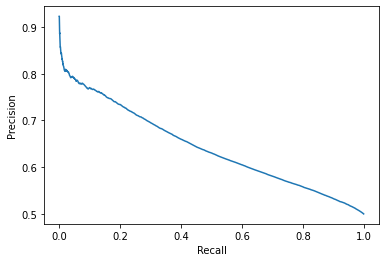

In [0]:
#pr = trainingSummary.pr.toPandas()
pr = lr_summary.pr.toPandas()
plt.plot(pr['recall'],pr['precision'])
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.show()

| | Input features | F2 | Balanced Accuracy | MCC | AUC |
| --- | --- | --- | --- | --- | --- |
| Train | OP_CARRIER, HOUR, MONTH, VisibilityAvg | 0.322 | 0.396 | -0.211 | 0.647 |
| Test | OP_CARRIER, HOUR, MONTH, VisibilityAvg | 0.232 | 0.4 | -0.150 | 0.649 |

note: these numbers are slightly different from results in the video due to difference in the random undersampling

Because we want to predict more positives, we used F2 score. F2 puts more attention on minimizing false negatives rather than false positives. The F2 score is fairly low for both train and test, with the train having slightly higher F2 score of 0.32, indicating that our model is not very good at classifying delays. 

Balanced accuracy ranges from 0 to 1, where 1 is the best and 0 is the worst. Both our test and train had similar balanced accuracy around 0.4, which can be considered poor accuracy. 

The range of values of MCC lie between -1 to +1, with +1 indicating a perfect classifier. Both our train and test models had negative MCC, indicating that our model is slightly predicting more of the opposite class from the actual value. 

The AUC for both train and test was similar around 0.65. This indicates that the model is slightly better than a score of 0.5 (random guessing), but is still a pretty poor performance. 

Overall, all four of our metrics for both test and train are indicating that the baseline model is predicting delays quite poorly, and there is room for significant improvement.

## Conclusion and Next Steps

The goal of our project is to improve on a baseline model for predicting flight departure delays to help airports plan operating decisions. We believe with features from the flight, weather, station data, and additional feature engineered variables, our modeling pipelines can accurately forecast departure delays 2 hours prior to the scheduled CRS departure. In this phase of the project, we have conducted some exploratory data analysis, joined the data, created a modeling pipeline, and created a baseline model indicating room for significant improvement. The baseline model overall had pretty poor predictions, and we plan to improve on it by adding features, doing feature engineering, and using forward chaining cross validation. As we add features to the model, we also hope to answer our hypothesis that adding prior flight information will be more predictive than having just the current weather and flight information

## Team Members and Responsibilities

* **Beijing Wu**: Weather EDA, Model Pipeline
* **Grace Lee**: Airline EDA. Written Sections. Baseline model metrics, Results and Conclusion. Notebook maintenance.
* **Shivangi Pandey**: Station EDA, Join
* **Sybil Santos-Burgan**: Airline & Join EDA. Pipeline block. Notebook maintenance. Blob storage.

<table>
<tr>
  <td>
    <figure>
    <img src="files/Beijing.jpg"  width="100" height="100">
    <div class="caption">Beijing</div>
    </figure>
  </td>
  <td>
    <figure>
    <img src="files/Shivangi.png"  width="100" height="100">
    <div class="caption">Shivangi</div>     
    </figure>
  </td>
  <td>
    <figure>
    <img src="files/Grace.jpg"  width="100" height="100">
    <div class="caption">Grace</div>
    </figure>
  </td>
  <td>
    <figure>
    <img src="files/Sybil.jpg"  width="100" height="100">
    <div class="caption" style="text-align: center;">Sybil</div>
    </figure>
  </td>
</tr>
</table>

## Open Issues or Problems

a)	The data is very large, so we anticipate issues running things, particularly anything that needs cross validation.

##References

“Air Travel Consumer Report: Consumer Complaints Against Airlines Rise More than 300 Percent above Pre-Pandemic Levels.” Air Travel Consumer Report: Consumer Complaints Against Airlines Rise More Than 300 Percent Above Pre-Pandemic Levels | Bureau of Transportation Statistics, https://www.bts.dot.gov/newsroom/air-travel-consumer-report-consumer-complaints-against-airlines-rise-more-300-percent.
 
US Domestic and International Delays and Cancellations Report, Flight Aware, https://public.tableau.com/app/profile/flightaware/viz/AirlineCancellationDelayUpdate/USAirlineCancellationsDelays.

https://www.nytimes.com/2022/07/01/travel/summer-travel-flight-delays-cancellations.html